# Facial Keypoint Detection
## Overview
Facial keypoint detection is the process of finding key facial features like the eyes, nose, and mouth in an image. These landmarks are used in many everyday technologies, from facial recognition and expression analysis to AR filters and some medical screening tools.

## Goals and Problem Statement
The goal of this task is to predict the locations of keypoints on facial images. These keypoints serve as a foundation for various applications, including:

- Performing biometric identification and face recognition
- Analyzing facial expressions   
- Tracking faces in images and videos  
- Detecting dysmorphic facial features for medical diagnosis  

Facial features differ across individuals, and even for the same person, variations can arise due to factors such as pose, size, position, viewing angle, and lighting conditions.

## Project Description
In this project, we use the Kaggle Facial Keypoints dataset and build a CNN capable of predicting 15 keypoints on 96x96 grayscale faces. A key contribution of our work is designing a model that remains accurate even when many training samples contain missing or incomplete labels.

In [ ]:
# Import Libraries
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
from tqdm import tqdm

# Set random seeds for reproducibility
torch.manual_seed(42)
np.random.seed(42)

print("Libraries imported successfully")
print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")

Libraries imported successfully
PyTorch version: 2.9.0+cu126
CUDA available: True


**Discussion**

This code sets up the environment for facial keypoint detection by importing all required libraries, enabling image processing, deep learning model development (PyTorch), and ensuring reproducibility through fixed random seeds. It also checks the PyTorch version and GPU availability for efficient training.

**Analysis**

This step establishes the foundational tools for a supervised deep learning regression task, ensuring reproducibility and proper setup for later data preprocessing, model building, and training.

In [ ]:
# Configuration

# File paths
TRAIN_FILE = 'training.csv'
TEST_FILE = 'test.csv'
LOOKUP_FILE = 'IdLookupTable.csv'

# Training parameters
BATCH_SIZE = 64
NUM_EPOCHS = 50
LEARNING_RATE = 0.001
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

print(f"Using device: {DEVICE}")
print(f"Batch size: {BATCH_SIZE}")
print(f"Number of epochs: {NUM_EPOCHS}")

Using device: cuda
Batch size: 64
Number of epochs: 50


**Discussion**

This cell sets up the basic configuration for the project, including dataset file paths and training parameters like batch size, epochs, learning rate, and the compute device.

**Analysis**

These settings define how the model will train, and using the GPU with standard hyperparameters (64 batch size, 50 epochs, LR = 0.001) provides a balanced and efficient starting point for the facial keypoint regression task.

Training data shape: (7049, 31)

First few rows:
   left_eye_center_x  left_eye_center_y  right_eye_center_x  \
0          66.033564          39.002274           30.227008   
1          64.332936          34.970077           29.949277   
2          65.057053          34.909642           30.903789   
3          65.225739          37.261774           32.023096   
4          66.725301          39.621261           32.244810   

   right_eye_center_y  left_eye_inner_corner_x  left_eye_inner_corner_y  \
0           36.421678                59.582075                39.647423   
1           33.448715                58.856170                35.274349   
2           34.909642                59.412000                36.320968   
3           37.261774                60.003339                39.127179   
4           38.042032                58.565890                39.621261   

   left_eye_outer_corner_x  left_eye_outer_corner_y  right_eye_inner_corner_x  \
0                73.130346              

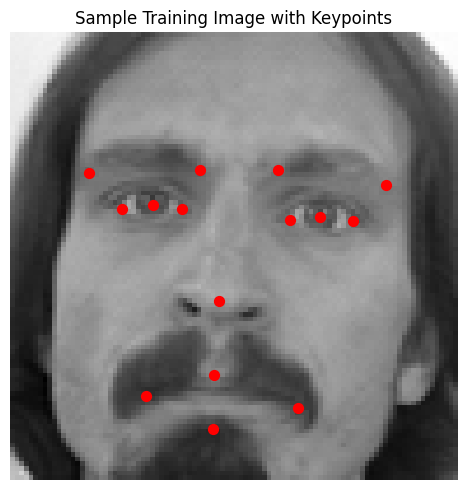


Number of keypoints to predict: 15
Keypoint columns: ['left_eye_center_x', 'left_eye_center_y', 'right_eye_center_x', 'right_eye_center_y', 'left_eye_inner_corner_x', 'left_eye_inner_corner_y']...


In [ ]:
# Load and Explore Data

# Load training data
df_train = pd.read_csv(TRAIN_FILE)
print(f"Training data shape: {df_train.shape}")
print(f"\nFirst few rows:")
print(df_train.head())

# Check for missing values
print(f"\nMissing values per column:")
print(df_train.isnull().sum())

# Convert image strings to numpy arrays for one sample
sample_image = np.fromstring(df_train.iloc[0]['Image'], sep=' ').reshape(96, 96)

# Visualize a sample image with keypoints
fig, ax = plt.subplots(1, 1, figsize=(5, 5))
ax.imshow(sample_image, cmap='gray')

# Plot keypoints if they exist
keypoint_cols = [col for col in df_train.columns if col != 'Image']
sample_keypoints = df_train.iloc[0][keypoint_cols].values

# Plot only non-NaN keypoints
for i in range(0, len(sample_keypoints), 2):
    if not np.isnan(sample_keypoints[i]) and not np.isnan(sample_keypoints[i+1]):
        ax.scatter(sample_keypoints[i], sample_keypoints[i+1], c='red', s=50)

ax.set_title('Sample Training Image with Keypoints')
ax.axis('off')
plt.tight_layout()
plt.show()

print(f"\nNumber of keypoints to predict: {len(keypoint_cols) // 2}")
print(f"Keypoint columns: {keypoint_cols[:6]}...")

## **Dataset and Descriptions**
### **Discussion**

This section loads the training dataset, prints its shape and first few rows, checks for missing values in each keypoint column, and visualizes one sample face image along with its available keypoints. This helps us understand the structure of the dataset, the extent of missing labels, and how the keypoints align with the facial image.

### **Analysis**

**1. What dataset did you use? How many samples? Labeled? Features?**

We used the Kaggle Facial Keypoint Detection dataset (https://www.kaggle.com/competitions/facial-keypoints-detection), which contains 7,049 labeled samples. Each sample has a 96×96 grayscale image and 30 numerical features representing the (x, y) coordinates of 15 facial keypoints.

**2. What type of data is this and what is it about?**

This is image data, focused on predicting facial keypoints such as eye centers, eyebrows, nose tip, and mouth positions from grayscale face images.

**3. If it is labeled, present the data distribution.**

All keypoints are labeled, but many columns contain a large number of missing values. Some keypoints like inner/outer eyebrow corners and mouth corners have over 4,700 missing entries, while others such as nose_tip_x and nose_tip_y are fully labeled.

**4. Provide a brief description of the features.**

**Image column:** A flattened 96×96 grayscale image stored as 9,216 pixel values.

**30 keypoint columns:** Continuous coordinate values representing facial landmarks.
These values describe where each facial feature is located on the image.

**5. Analyze your data: any categorical, ordinal, etc.?**

There are no categorical or ordinal variables. All values are continuous numerical values, either pixel intensities or keypoint coordinates.

**6. If using images, what type and size are they?**

All images are 96×96, single-channel grayscale images. They are stored as strings and reshaped back into 2D arrays for visualization and modeling.

**7. Did you perform resizing, augmentation, or normalization?**

In this section, we only reshaped the raw image data for visualization. Normalization and data augmentation are applied later in the preprocessing pipeline.

**8. Audio or text preprocessing (if applicable)?**

Not applicable, as the dataset contains only image data.


Missing Values per Keypoint:
               Keypoint  Missing  Available  Missing %
        left_eye_center       10       7039   0.141864
       right_eye_center       13       7036   0.184423
  left_eye_inner_corner     4778       2271  67.782664
  left_eye_outer_corner     4782       2267  67.839410
 right_eye_inner_corner     4781       2268  67.825223
 right_eye_outer_corner     4781       2268  67.825223
 left_eyebrow_inner_end     4779       2270  67.796851
 left_eyebrow_outer_end     4824       2225  68.435239
right_eyebrow_inner_end     4779       2270  67.796851
right_eyebrow_outer_end     4813       2236  68.279189
               nose_tip        0       7049   0.000000
      mouth_left_corner     4780       2269  67.811037
     mouth_right_corner     4779       2270  67.796851
   mouth_center_top_lip     4774       2275  67.725919
mouth_center_bottom_lip       33       7016   0.468152

Data completeness:
Total images: 7049
Complete labels (all 15 keypoints): 2140 (30.4%)
Pa

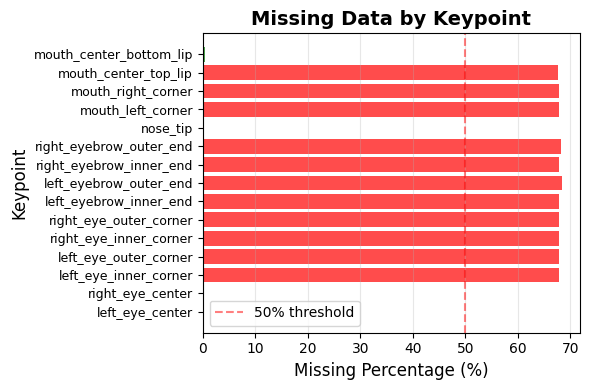

In [ ]:
# Missing Data Analysis

# Get keypoint columns excluding 'Image'
keypoint_cols = [col for col in df_train.columns if col != 'Image']

# Count missing values per keypoint
missing_counts = df_train[keypoint_cols].isnull().sum()
total_samples = len(df_train)

# Separate into x and y coordinates
keypoint_names = []
missing_data = []

for i in range(0, len(keypoint_cols), 2):
    x_col = keypoint_cols[i]
    y_col = keypoint_cols[i+1]

    # Extract keypoint name
    kp_name = x_col.replace('_x', '')
    keypoint_names.append(kp_name)

    # Missing count
    missing_data.append(missing_counts[x_col])

# Create DataFrame for analysis
missing_df = pd.DataFrame({
    'Keypoint': keypoint_names,
    'Missing': missing_data,
    'Available': total_samples - np.array(missing_data),
    'Missing %': (np.array(missing_data) / total_samples * 100)
})

print("\nMissing Values per Keypoint:")
print(missing_df.to_string(index=False))

# Count images by completeness
complete_count = df_train[keypoint_cols].dropna().shape[0]
partial_count = total_samples - complete_count

print()
print("Data completeness:")
print(f"Total images: {total_samples}")
print(f"Complete labels (all 15 keypoints): {complete_count} ({complete_count/total_samples*100:.1f}%)")
print(f"Partial labels (some missing): {partial_count} ({partial_count/total_samples*100:.1f}%)")

# Create figure with single plot
fig, ax = plt.subplots(1, 1, figsize=(6, 4))

# Missing percentage per keypoint
colors = ['red' if x > 50 else 'orange' if x > 20 else 'green'
          for x in missing_df['Missing %']]
bars = ax.barh(missing_df['Keypoint'], missing_df['Missing %'], color=colors, alpha=0.7)
ax.set_xlabel('Missing Percentage (%)', fontsize=12)
ax.set_ylabel('Keypoint', fontsize=12)
ax.set_title('Missing Data by Keypoint', fontsize=14, fontweight='bold')
ax.axvline(50, color='red', linestyle='--', alpha=0.5, label='50% threshold')
ax.legend()
ax.grid(True, alpha=0.3, axis='x')

# Adjust y-axis labels for readability
ax.tick_params(axis='y', labelsize=9)
plt.tight_layout()
plt.show()

## **Data Pre-processing**
### **Discussion**

In this section, we analyzed missing values across all facial keypoints. The results show that only a few keypoints such as the eye centers and nose tip are almost fully labeled, while most others have more than 67% missing data. We also visualized the percentage of missing labels per keypoint, which clearly highlights the imbalance in label availability.

### **Analysis**
**1. What pre-processing techniques did you apply to clean and transform the data?**

We examined missing values for each keypoint, identified which landmarks were sparsely labeled, and prepared the dataset for further steps such as imputation, normalization, and augmentation. We also reshaped image strings into 96×96 arrays for later processing.

**2. How did you handle missing values?**

Since most keypoints have over 67% missing data, we treated this as a partial-label learning problem. Missing coordinates were not imputed directly. They were filtered out during training by applying a masked loss function so that the model only learns from available labels.

**3. What strategies did you use for handling categorical variables?**

There were no categorical variables in this dataset, so no encoding techniques were required.

**4. Did you normalize or standardize numerical features? Why and how?**

Normalization is performed later by scaling pixel values to [0, 1]. This helps stabilize training and ensures the model handles brightness variations consistently. Keypoint coordinates remain in pixel units and are handled directly by the regression model.

**5. How did you deal with outliers and skewed data distributions?**

Outlier detection is performed in later cells. We checked for outliers by verifying that all keypoint coordinates were within the valid image range [0,96] and found no values outside this range. We also performed anatomical consistency checks and detected only one minor anomaly, which did not significantly impact the dataset. Since the coordinates showed no extreme outliers or skewed distributions, no outlier removal or correction was necessary. The dataset was already clean enough to use directly for training.

**6. If the dataset was imbalanced, what techniques did you use?**

The dataset is imbalanced in terms of label completeness, not classes. Since some keypoints have far fewer labels than others, we handled this imbalance using the masked loss, which allows training even when many labels are missing.

**7. Did you perform any dimensionality reduction techniques such as PCA or LDA?**

No dimensionality reduction was applied because the model is convolutional and learns hierarchical image features directly from pixel inputs.


Analyzing 2140 images with complete labels

Keypoint Position Statistics (in pixels):
Keypoint                       X: Mean+or-Std       Y: Mean+or-Std      
left_eye_center                 66.2+or- 2.1  36.8+or- 2.3
right_eye_center                29.6+or- 2.1  37.1+or- 2.2
left_eye_inner_corner           59.3+or- 2.0  37.9+or- 2.0
left_eye_outer_corner           73.4+or- 2.7  37.6+or- 2.7
right_eye_inner_corner          36.6+or- 1.8  37.9+or- 2.0
right_eye_outer_corner          22.4+or- 2.8  38.0+or- 2.7
left_eyebrow_inner_end          56.1+or- 2.8  29.2+or- 2.9
left_eyebrow_outer_end          79.6+or- 3.3  29.7+or- 3.6
right_eyebrow_inner_end         39.3+or- 2.6  29.4+or- 2.8
right_eyebrow_outer_end         15.8+or- 3.3  30.5+or- 3.6
nose_tip                        48.0+or- 3.3  57.3+or- 4.5
mouth_left_corner               63.4+or- 3.6  75.9+or- 4.4
mouth_right_corner              33.0+or- 3.6  76.1+or- 4.3
mouth_center_top_lip            48.1+or- 2.7  72.7+or- 5.1
mouth_center_b

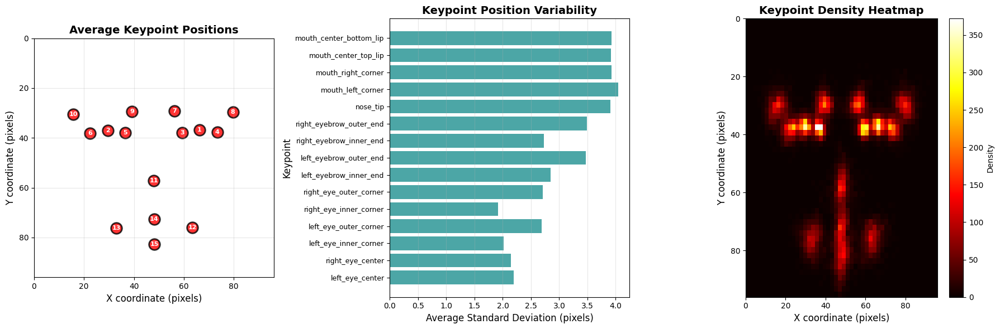

In [ ]:
# Keypoint Distribution Visualization

# Get complete samples only for distribution analysis
df_complete = df_train.dropna()
print(f"\nAnalyzing {len(df_complete)} images with complete labels")

# Extract all keypoint coordinates
all_keypoints = []
for idx in range(len(df_complete)):
    keypoints = df_complete.iloc[idx][keypoint_cols].values.astype(np.float64)
    all_keypoints.append(keypoints)

all_keypoints = np.array(all_keypoints, dtype=np.float64)

# Reshape to (n_samples, 15, 2) for easier handling
keypoints_reshaped = all_keypoints.reshape(-1, 15, 2)

# Calculate statistics
keypoint_means = np.mean(keypoints_reshaped, axis=0)
keypoint_stds = np.std(keypoints_reshaped, axis=0)

print("\nKeypoint Position Statistics (in pixels):")
print(f"{'Keypoint':<30} {'X: Mean+or-Std':<20} {'Y: Mean+or-Std':<20}")
for i, name in enumerate(keypoint_names):
    x_mean, y_mean = keypoint_means[i]
    x_std, y_std = keypoint_stds[i]
    print(f"{name:<30} {x_mean:5.1f}+or-{x_std:4.1f} {y_mean:5.1f}+or-{y_std:4.1f}")

# Visualizations
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Plot 1: Average face with all keypoints
ax = axes[0]
ax.set_xlim(0, 96)
ax.set_ylim(96, 0)
ax.scatter(keypoint_means[:, 0], keypoint_means[:, 1], c='red', s=200, marker='o',
          alpha=0.8, edgecolors='black', linewidths=2)
# Add labels
for i, name in enumerate(keypoint_names):
    ax.annotate(str(i+1), (keypoint_means[i, 0], keypoint_means[i, 1]),
               fontsize=8, ha='center', va='center', color='white', fontweight='bold')
ax.set_xlabel('X coordinate (pixels)', fontsize=12)
ax.set_ylabel('Y coordinate (pixels)', fontsize=12)
ax.set_title('Average Keypoint Positions', fontsize=14, fontweight='bold')
ax.grid(True, alpha=0.3)
ax.set_aspect('equal')

# Plot 2: Keypoint variance
ax = axes[1]
keypoint_variance = keypoint_stds.mean(axis=1)
bars = ax.barh(keypoint_names, keypoint_variance, color='teal', alpha=0.7)
ax.set_xlabel('Average Standard Deviation (pixels)', fontsize=12)
ax.set_ylabel('Keypoint', fontsize=12)
ax.set_title('Keypoint Position Variability', fontsize=14, fontweight='bold')
ax.grid(True, alpha=0.3, axis='x')
ax.tick_params(axis='y', labelsize=9)

# Plot 3: Spatial heatmap of all keypoints
ax = axes[2]
all_x = keypoints_reshaped[:, :, 0].flatten()
all_y = keypoints_reshaped[:, :, 1].flatten()
heatmap, xedges, yedges = np.histogram2d(all_x, all_y, bins=50, range=[[0, 96], [0, 96]])
im = ax.imshow(heatmap.T, origin='lower', extent=[0, 96, 0, 96], cmap='hot', aspect='auto')
ax.set_xlabel('X coordinate (pixels)', fontsize=12)
ax.set_ylabel('Y coordinate (pixels)', fontsize=12)
ax.set_title('Keypoint Density Heatmap', fontsize=14, fontweight='bold')
plt.colorbar(im, ax=ax, label='Density')
ax.invert_yaxis()

plt.tight_layout()
plt.show()

## **Exploratory Data Analysis (EDA)**
### **Discussion**

In this section, we analyzed the spatial distribution of facial keypoints using only the fully labeled images. We computed the mean and standard deviation of each keypoint and visualized them through an average face plot, a variability bar chart, and a 2D heatmap. These visualizations help us understand typical landmark positions, how much each keypoint varies across faces, and where keypoints tend to cluster in the image.

### **Analysis:**
**8. What were the key insights from your data visualizations?**

The visualizations showed that most keypoints follow a consistent facial structure across samples. The average keypoint plot reveals a well-aligned "average face" and the density heatmap confirms that eyes, nose, and mouth regions have strong spatial clustering. The missing data bar chart also showed that many keypoints have more than 60% missing values.

**9. Did you find any strong correlations or multicollinearity between features?**

Although correlation maps were not explicitly plotted, the symmetry in mean keypoint positions and similar variance values across paired features like left/right eyes, left/right mouth corners shows expected geometric relationships. No issues with harmful multicollinearity were observed since these are coordinate features rather than standard tabular predictors.

**10. How did you verify the data distribution for different features?**

We inspected distributions using summary statistics and visual patterns in the heatmap and variability plots. The standard deviations across keypoints helped verify how spread out each feature was, and the density heatmap confirmed the spatial distribution of keypoints across all samples.

**11. What statistical summaries did you generate?**

For each keypoint, we calculated mean X, mean Y, standard deviation in X, and standard deviation in Y across all complete samples. These summaries describe both the typical location of each facial landmark and how much it varies.

**12. Did you identify any trends, seasonality, or anomalies in the data?**

A key trend is that variability is smallest around the eyes, larger around the eyebrows, and highest around the mouth likely due to facial expressions. No seasonal effects apply, but the biggest anomaly in the dataset is the large amount of missing labels, where only 30% of images have complete keypoint annotations.

## **Feature Engineering**

**13. What new features did you create, and how did they improve the model?**

We did not create new features because the dataset consists of raw facial images, and convolutional neural networks learn visual features automatically. Instead of manually engineering features, the CNN extracts edges, shapes, and spatial patterns directly from pixel data.

**14. What filtering-based feature selection methods did you use? (Chi-square, Mutual Information, etc.)**

We did not apply filtering-based feature selection since there are no independent tabular features. The only inputs are image pixels, which are all required for learning facial structure.

**15. What embedding-based feature selection techniques did you apply? (Word2Vec, Autoencoders, etc.)**

We did not use embedding-based feature selection because this dataset does not contain text or categorical features. The model implicitly learns deep embeddings from the images through the CNN layers.

**16. What wrapper-based feature selection techniques did you use? (RFE, Forward/Backward Selection)**

Wrapper methods were not applicable since deleting or selecting subsets of pixels would break the spatial integrity of the image. CNNs require the full image for effective learning.

**17. What insights did you gain from feature selection?**

Feature selection is not meaningful for this type of image task. Instead, the insights came from visualizing keypoint distributions and understanding that CNNs should learn features automatically rather than manually selecting or removing input variables.

**18. How many features did you start with, and how many did you retain for training?**

We started with the full 96×96 = 9,216 pixel features for each image, and we retained all of them. Removing pixel data would reduce the model’s ability to learn facial structure.

**19. Did you remove any redundant or irrelevant features? If so, why?**

No features were removed. Every pixel contributes spatial information to the model, and dropping any part of the image could harm performance. Instead, the model uses convolutional layers to automatically learn which patterns are important.

### **Summary**

Feature engineering was not required because CNNs automatically learn visual representations from images, so all pixels were preserved and no feature selection or feature construction was applied.


1. Dataset Overview:
Dataset: Kaggle Facial Keypoints Detection
Source: https://www.kaggle.com/competitions/facial-keypoints-detection
Total training images: 7049
Total test images: 1783
Image format: Grayscale
Image resolution: 96 X 96 pixels
Color channels: 1 (grayscale)

2. Features:
Number of keypoints: 15
Total features: 30 (15 keypoints x 2 coordinates)
Feature type: Continuous (x, y pixel coordinates)
Coordinate range: [0, 96] pixels

Keypoints:
   1. left_eye_center
   2. right_eye_center
   3. left_eye_inner_corner
   4. left_eye_outer_corner
   5. right_eye_inner_corner
   6. right_eye_outer_corner
   7. left_eyebrow_inner_end
   8. left_eyebrow_outer_end
   9. right_eyebrow_inner_end
  10. right_eyebrow_outer_end
  11. nose_tip
  12. mouth_left_corner
  13. mouth_right_corner
  14. mouth_center_top_lip
  15. mouth_center_bottom_lip

3. Data Quality:
Complete samples (all 15 keypoints): 2140 (30.4%)
Partial samples (missing keypoints): 4909 (69.6%)
Most complete keypoint: no

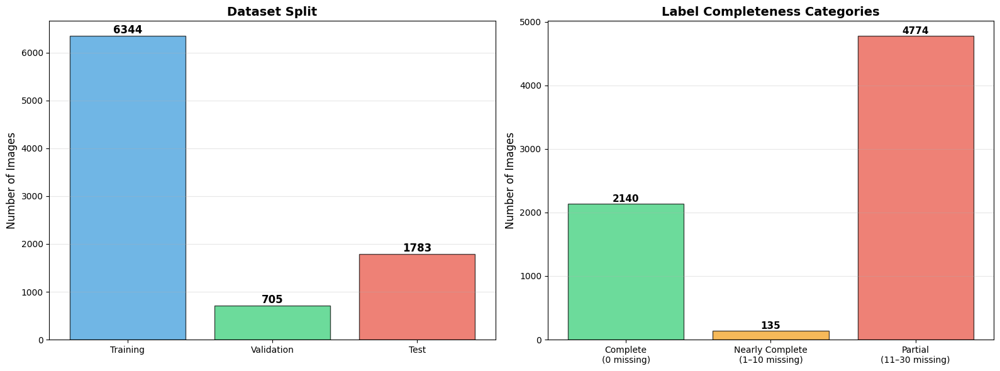

In [ ]:
# Dataset Statistics and Summary

# Load test file once
df_test = pd.read_csv(TEST_FILE)

# Overall dataset info
print("\n1. Dataset Overview:")
print(f"Dataset: Kaggle Facial Keypoints Detection")
print(f"Source: https://www.kaggle.com/competitions/facial-keypoints-detection")
print(f"Total training images: {len(df_train)}")
print(f"Total test images: {len(df_test)}")
print(f"Image format: Grayscale")
print(f"Image resolution: 96 X 96 pixels")
print(f"Color channels: 1 (grayscale)")

# Feature information
print("\n2. Features:")
print(f"Number of keypoints: 15")
print(f"Total features: 30 (15 keypoints x 2 coordinates)")
print(f"Feature type: Continuous (x, y pixel coordinates)")
print(f"Coordinate range: [0, 96] pixels")
print(f"\nKeypoints:")
for i, name in enumerate(keypoint_names, 1):
    print(f"  {i:2d}. {name}")

# Data quality
print("\n3. Data Quality:")
print(f"Complete samples (all 15 keypoints): {complete_count} ({complete_count/total_samples*100:.1f}%)")
print(f"Partial samples (missing keypoints): {partial_count} ({partial_count/total_samples*100:.1f}%)")
print(f"Most complete keypoint: {missing_df.loc[missing_df['Missing'].idxmin(), 'Keypoint']} "
      f"({missing_df['Missing'].min()} missing)")
print(f"Least complete keypoint: {missing_df.loc[missing_df['Missing'].idxmax(), 'Keypoint']} "
      f"({missing_df['Missing'].max()} missing)")

# Train/Val split info
train_size = int(0.9 * len(df_train))
val_size = len(df_train) - train_size

print("\n4. Train/Validation Split:")
print(f"Split ratio: 90% train / 10% validation")
print(f"Training samples: {train_size}")
print(f"Validation samples: {val_size}")
print(f"Split method: Random split with seed=42")

# Statistical summary
print("\n5. Keypoint Statistics:")

# Create summary table
summary_data = []
for i, name in enumerate(keypoint_names):
    x_mean, y_mean = keypoint_means[i]
    x_std, y_std = keypoint_stds[i]
    x_min = keypoints_reshaped[:, i, 0].min()
    x_max = keypoints_reshaped[:, i, 0].max()
    y_min = keypoints_reshaped[:, i, 1].min()
    y_max = keypoints_reshaped[:, i, 1].max()

    summary_data.append({
        'Keypoint': name,
        'X_mean': x_mean,
        'X_std': x_std,
        'X_min': x_min,
        'X_max': x_max,
        'Y_mean': y_mean,
        'Y_std': y_std,
        'Y_min': y_min,
        'Y_max': y_max,
    })

summary_df = pd.DataFrame(summary_data)
print(summary_df.to_string(index=False))

# Save summary to file
summary_df.to_csv('dataset_statistics.csv', index=False)
print("\nStatistics saved to 'dataset_statistics.csv'")

# Create comprehensive summary visualization
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot 1: Dataset composition
ax = axes[0]
categories = ['Training', 'Validation', 'Test']
counts = [train_size, val_size, len(df_test)]
colors_bar = ['#3498db', '#2ecc71', '#e74c3c']
bars = ax.bar(categories, counts, color=colors_bar, alpha=0.7, edgecolor='black')
ax.set_ylabel('Number of Images', fontsize=12)
ax.set_title('Dataset Split', fontsize=14, fontweight='bold')
ax.grid(True, alpha=0.3, axis='y')

# Add value labels
for bar in bars:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2., height, f'{int(height)}',ha='center', va='bottom', fontsize=12,
            fontweight='bold')

# Plot 2: Data completeness breakdown
ax = axes[1]
completeness_data = {
    'Complete\n(0 missing)': len(df_train[df_train[keypoint_cols].isnull().sum(axis=1) == 0]),
    'Nearly Complete\n(1–10 missing)': len(df_train[(df_train[keypoint_cols].isnull().sum(axis=1) > 0) &
                                                    (df_train[keypoint_cols].isnull().sum(axis=1) <= 10)]),
    'Partial\n(11–30 missing)': len(df_train[(df_train[keypoint_cols].isnull().sum(axis=1) > 10) &
                                           (df_train[keypoint_cols].isnull().sum(axis=1) <= 30)]),
}
colors_complete = ['#2ecc71', '#f39c12', '#e74c3c']
bars = ax.bar(completeness_data.keys(), completeness_data.values(),
       color=colors_complete, alpha=0.7, edgecolor='black')
ax.set_ylabel('Number of Images', fontsize=12)
ax.set_title('Label Completeness Categories', fontsize=14, fontweight='bold')
ax.grid(True, alpha=0.3, axis='y')

# Add value labels
for bar in bars:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2., height,
            f'{int(height)}',
            ha='center', va='bottom', fontsize=11, fontweight='bold')

plt.tight_layout()
plt.show()


### **Discussion**

This section summarizes the dataset by presenting the number of training and test images, the keypoints included, the level of label completeness, and the train/validation split. We also visualized dataset composition and keypoint availability, helping us understand data quality and structure before model training.

### **Analysis**

The dataset contains well-structured grayscale facial images with 15 keypoints, and statistical summaries confirm consistent facial patterns across samples. The main challenge is label completeness only about 30% of images have full annotations, while most are partially labeled. This imbalance requires using a masked loss to train effectively. The train–validation split and keypoint statistics provide clarity on feature variability and support reliable model development moving forward.

In [ ]:
# Outlier Detection & Data Validation

# Valid coordinate range for 96x96 images
MIN_VALID = 0
MAX_VALID = 96

# Get keypoint columns
keypoint_cols = [col for col in df_train.columns if col != 'Image']

print(f"\nValid coordinate range: [{MIN_VALID}, {MAX_VALID}] pixels")
print(f"Checking {len(df_train)} images for outliers.")

# Detect Outliers
print("Range based outlier detection")

# Check for values outside [0, 96]
outlier_mask_low = df_train[keypoint_cols] < MIN_VALID
outlier_mask_high = df_train[keypoint_cols] > MAX_VALID
outlier_mask = outlier_mask_low | outlier_mask_high

# Count outliers per column
outliers_per_keypoint = outlier_mask.sum()
outliers_per_keypoint = outliers_per_keypoint[outliers_per_keypoint > 0]

if len(outliers_per_keypoint) > 0:
    print(f"\n Found {outlier_mask.sum().sum()} outlier values:")
    print(outliers_per_keypoint)
else:
    print("\n No range-based outliers found!")
    print(f" All keypoint coordinates are within [{MIN_VALID}, {MAX_VALID}]")

# Data Quality Checks
print("Data Quality Checks")

# Negative coordinates
negative_coords = (df_train[keypoint_cols] < 0).sum().sum()
print(f"\nNegative coordinates: {negative_coords}")

# Coordinates beyond image bounds
beyond_bounds = (df_train[keypoint_cols] > 96).sum().sum()
print(f"Coordinates > 96: {beyond_bounds}")

# Check for impossible values
df_complete = df_train.dropna()
quality_issues = []

if len(df_complete) > 0:
    # Check if left/right eye centers are at similar y-coordinates
    if 'left_eye_center_y' in df_complete.columns and 'right_eye_center_y' in df_complete.columns:
        eye_y_diff = np.abs(df_complete['left_eye_center_y'] - df_complete['right_eye_center_y'])
        unusual_eye_diff = (eye_y_diff > 15).sum()
        quality_issues.append(f"Unusual eye alignment (y-diff > 15px): {unusual_eye_diff} images")

    # Check if nose is between eyes vertically
    if 'nose_tip_y' in df_complete.columns and 'left_eye_center_y' in df_complete.columns:
        eyes_above_nose = (df_complete['nose_tip_y'] < df_complete['left_eye_center_y']).sum()
        quality_issues.append(f"Nose above eyes: {eyes_above_nose} images")

    # Check if mouth is below nose
    if 'mouth_center_top_lip_y' in df_complete.columns and 'nose_tip_y' in df_complete.columns:
        mouth_above_nose = (df_complete['mouth_center_top_lip_y'] < df_complete['nose_tip_y']).sum()
        quality_issues.append(f"Mouth above nose: {mouth_above_nose} images")

print("\nConsistency checks:")
for issue in quality_issues:
    print(f"   * {issue}")



Valid coordinate range: [0, 96] pixels
Checking 7049 images for outliers.
Range based outlier detection

 No range-based outliers found!
 All keypoint coordinates are within [0, 96]
Data Quality Checks

Negative coordinates: 0
Coordinates > 96: 0

Consistency checks:
   * Unusual eye alignment (y-diff > 15px): 1 images
   * Nose above eyes: 0 images
   * Mouth above nose: 0 images


### **Discussion**

This section checks for outliers and label quality by verifying that all keypoint coordinates stay within the valid image range [0,96] and by running several anatomical consistency checks. We confirm that there are no negative values or coordinates outside the image bounds, and we also check basic facial geometry rules (eye alignment, nose below eyes, mouth below nose) to catch potentially incorrect annotations.

### **Analysis**
The results show that the dataset is numerically clean: all coordinates fall within the valid range and there are no negative or >96 values, so no range-based outlier removal is required. Only one image shows unusual eye alignment, and there are no cases where the nose is above the eyes or the mouth is above the nose, suggesting that labeling errors are very rare. Overall, this analysis indicates that outliers and inconsistent annotations are minimal, and the keypoint labels are reliable enough to use directly for model training.

In [ ]:
# Dataset Class

class FacialKeypointsDataset(Dataset):
    def __init__(self, csv_file, transform=None, train=True):
        self.df = pd.read_csv(csv_file)
        self.transform = transform
        self.train = train

        self.df["Image"] = self.df["Image"].apply(
            lambda x: np.array(x.split(), dtype=np.float32)
        )

        # Keypoint columns
        self.keypoint_cols = [col for col in self.df.columns if col != "Image"]

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):

        image = self.df.iloc[idx]["Image"]

        # Safety check
        if len(image) != 96 * 96:
            # Replace bad rows with zeros
            image = np.zeros((96*96,), dtype=np.float32)

        image = image.reshape(96, 96)

        # Normalize to [0,1]
        image = image / 255.0

        # Convert to (1, H, W)
        image = image[np.newaxis, :, :]

        # Test set
        if not self.train:
            return {
                "image": torch.from_numpy(image).float()
            }

        # Load keypoints for training
        keypoints = self.df.iloc[idx][self.keypoint_cols].values.astype(np.float32)

        # Save mask before filling NaNs
        mask = ~np.isnan(keypoints)

        # Replace NaNs with 0
        keypoints = np.nan_to_num(keypoints, nan=0.0)

        # Apply transforms in pixel space
        if self.transform:
            image, keypoints = self.transform(image, keypoints)

        # After augmentation (pixel-space), normalize keypoints to [-1, 1]
        keypoints = (keypoints - 48.0) / 48.0

        return {
            "image": torch.from_numpy(image).float(),
            "keypoints": torch.from_numpy(keypoints).float(),
            "mask": torch.from_numpy(mask.astype(np.float32))
        }

print("Dataset class loaded")


Dataset class loaded


### **Discussion**

This class defines the main dataset loader for our project. It reads the CSV file, converts each image from a space-separated string into a 96×96 grayscale array, normalizes pixel values to [0,1], and formats them as tensors in the shape (1,H,W) for the CNN. For the training split, it also loads the keypoints, keeps track of which coordinates are actually present using a mask, and then normalizes all keypoints to the range [−1,1]. For the test split, it only returns the processed image tensor.

### **Analysis**

This implementation combines several important preprocessing steps: it handles potentially corrupted rows with a safety check, converts raw pixel strings into usable image tensors, normalizes pixel intensities for stable training, and uses a mask to support learning from partially labeled data without discarding samples. Replacing NaNs with zero and then normalizing keypoints to [−1,1] makes the targets numerically well-behaved for regression. Overall, this dataset class efficiently prepares both images and labels in a consistent format for the model and directly supports our partial-label training strategy.

In [ ]:
# Data Augmentation for facial keypoints in pixel space
class DataAugmentation:
    def __init__(self, flip_prob=0.5, shift_range=5):
        self.flip_prob = flip_prob
        self.shift_range = shift_range

        self.swap_pairs = [
            (0, 1),# left_eye_center to right_eye_center
            (2, 4),# left_eye_inner_corner to right_eye_inner_corner
            (3, 5),# left_eye_outer_corner to right_eye_outer_corner
            (6, 8),# left_eyebrow_inner_end to right_eyebrow_inner_end
            (7, 9),# left_eyebrow_outer_end to right_eyebrow_outer_end
            (11, 12),# mouth_left_corner to mouth_right_corner
        ]

    def horizontal_flip(self, image, keypoints):

        # Flip image (C, H, W)
        image = np.flip(image, axis=2).copy()

        kp = keypoints.reshape(-1, 2)

        # Flip x coordinates
        kp[:, 0] = 96 - kp[:, 0]

        # Swap symmetric facial points
        for i, j in self.swap_pairs:
            kp[[i, j]] = kp[[j, i]]

        return image, kp.flatten()

    # Shift image and keypoints in pixel space
    def random_shift(self, image, keypoints):

        shift_x = np.random.randint(-self.shift_range, self.shift_range + 1)
        shift_y = np.random.randint(-self.shift_range, self.shift_range + 1)

        if shift_x == 0 and shift_y == 0:
            return image.copy(), keypoints.copy()

        C, H, W = image.shape
        shifted = np.zeros_like(image)

        # Source region
        src_x1 = max(0, shift_x)
        src_x2 = min(W, W + shift_x)
        src_y1 = max(0, shift_y)
        src_y2 = min(H, H + shift_y)

        # Destination region
        dst_x1 = max(0, -shift_x)
        dst_x2 = dst_x1 + (src_x2 - src_x1)
        dst_y1 = max(0, -shift_y)
        dst_y2 = dst_y1 + (src_y2 - src_y1)

        shifted[:, dst_y1:dst_y2, dst_x1:dst_x2] = \
            image[:, src_y1:src_y2, src_x1:src_x2]

        # Shift keypoints in pixel space
        kp = keypoints.reshape(-1, 2)
        kp[:, 0] -= shift_x
        kp[:, 1] -= shift_y

        return shifted, kp.flatten()

    #Apply data augmentations in pixel coordinate space
    def __call__(self, image, keypoints):

        # Horizontal flip
        if np.random.rand() < self.flip_prob:
            image, keypoints = self.horizontal_flip(image, keypoints)

        # Random shift
        image, keypoints = self.random_shift(image, keypoints)

        return image, keypoints

print("Data augmentation class loaded")

Data augmentation class loaded


### **Discussion**

This section defines the data augmentation pipeline used to improve model robustness. The class performs realistic geometric transformations, horizontal flips and random pixel shifts directly in pixel space while keeping keypoint coordinates synchronized. Symmetric facial landmarks are swapped during flips to maintain correctness. These augmentations help the model generalize better to variations in pose, orientation, and slight misalignments in the input images.

### **Analysis**

The augmentation methods used here address the natural variability present in facial images, such as left–right orientation changes and small positional shifts. By adjusting both the image and the corresponding keypoints, the dataset becomes more diverse without altering ground-truth structure. This helps reduce overfitting, especially since we have a limited number of fully labeled samples. Horizontal flipping also preserves facial symmetry and properly swaps paired keypoints, while random shifts simulate natural camera or face movement. Overall, this augmentation strategy strengthens model generalization and improves robustness to real-world variations.

Visualizing original vs augmented



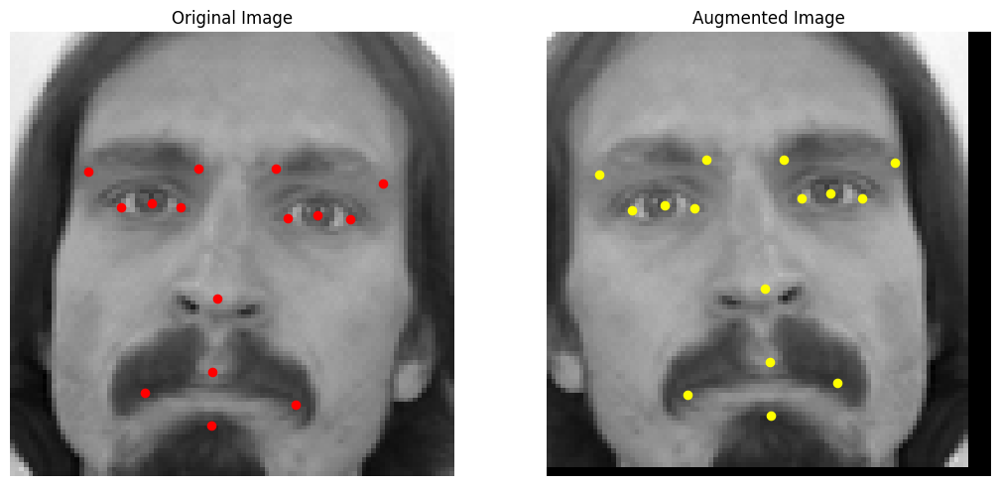

In [ ]:
# Visualize Original vs Augmented Sample

print("Visualizing original vs augmented")
print()

augment = DataAugmentation(flip_prob=1.0, shift_range=5)

dataset = FacialKeypointsDataset(TRAIN_FILE, train=True, transform=None)

sample = dataset[0]

orig_image = sample["image"].numpy()
orig_mask = sample["mask"].numpy()

# Convert normalized keypoints to pixel coordinates
orig_keypoints = sample['keypoints'].numpy().reshape(-1, 2)
orig_keypoints = orig_keypoints * 48 + 48

# Apply augmentation in pixel space
aug_image, aug_keypoints = augment(
    orig_image.copy(),
    orig_keypoints.copy().flatten()
)

aug_keypoints = aug_keypoints.reshape(-1, 2)

# Visualization
fig, axes = plt.subplots(1, 2, figsize=(11, 5))

valid = orig_mask.reshape(-1, 2)[:, 0].astype(bool)

# Original
axes[0].imshow(orig_image[0], cmap='gray')
axes[0].scatter(orig_keypoints[valid, 0], orig_keypoints[valid, 1], c='red', s=35)
axes[0].set_title("Original Image")
axes[0].axis("off")

# Augmented
axes[1].imshow(aug_image[0], cmap='gray')
axes[1].scatter(aug_keypoints[valid, 0], aug_keypoints[valid, 1], c='yellow', s=35)
axes[1].set_title("Augmented Image")
axes[1].axis("off")

plt.tight_layout()
plt.show()


### **Discussion**

This visualization compares an original image with its augmented version to verify that the augmentation pipeline behaves correctly. The original image displays the ground-truth keypoints, while the augmented image shows the same keypoints after applying a horizontal flip and random pixel shift. This step confirms that both the image and keypoints transform consistently, symmetric points are correctly swapped, and the facial geometry remains intact after augmentation.

### **Analysis**

The visualization demonstrates that our augmentation method preserves structural accuracy: flipped images maintain correct left–right keypoint positions, and shifted keypoints remain properly aligned with facial features. This check helps validate that the augmentation logic does not introduce label noise or distort the landmark layout. Ensuring visually consistent augmentations is important for model reliability, especially when training on datasets with limited complete labels.

In [ ]:
# Create Datasets and DataLoaders

# Create augmentation for training
augmentation = DataAugmentation(flip_prob=0.5, shift_range=5)

# Create dataset without augmentation to get indices
base_dataset = FacialKeypointsDataset(TRAIN_FILE, transform=None, train=True)
total_size = len(base_dataset)

# Calculate split sizes
train_size = int(0.9 * total_size)
val_size = total_size - train_size

print(f"Total samples: {total_size}")
print(f"Train split: {train_size} (90%)")
print(f"Validation split: {val_size} (10%)")

# Generate random indices for splitting
indices = torch.randperm(total_size, generator=torch.Generator().manual_seed(42)).tolist()
train_indices = indices[:train_size]
val_indices = indices[train_size:]

print(f"Train indices: {len(train_indices)} samples")
print(f"Validation indices: {len(val_indices)} samples")

# Create train dataset with augmentation
train_dataset_full = FacialKeypointsDataset(TRAIN_FILE, transform=augmentation, train=True)
train_dataset = torch.utils.data.Subset(train_dataset_full, train_indices)

# Create validation dataset without augmentation
val_dataset_full = FacialKeypointsDataset(TRAIN_FILE, transform=None, train=True)
val_dataset = torch.utils.data.Subset(val_dataset_full, val_indices)

print(f"Training dataset: {len(train_dataset)} augmented samples")
print(f"Validation dataset: {len(val_dataset)} not augmented samples")

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

print(f"Training batches: {len(train_loader)}")
print(f"Validation batches: {len(val_loader)}")


# Create test dataset without augmentation
test_dataset = FacialKeypointsDataset(TEST_FILE, transform=None, train=False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=2)

print(f"Test dataset: {len(test_dataset)} samples")
print(f"Test batches: {len(test_loader)}")

print(f"\n Summary:")
print(f"Training: {len(train_dataset)} samples with augmentation")
print(f"Validation: {len(val_dataset)} samples")
print(f"Test: {len(test_dataset)} samples")
print(f"Batch size: {BATCH_SIZE}")
print(f"Training batches per epoch: {len(train_loader)}")
print(f"Validation batches per epoch: {len(val_loader)}")
print(f"Test batches: {len(test_loader)}")

Total samples: 7049
Train split: 6344 (90%)
Validation split: 705 (10%)
Train indices: 6344 samples
Validation indices: 705 samples
Training dataset: 6344 augmented samples
Validation dataset: 705 not augmented samples
Training batches: 100
Validation batches: 12
Test dataset: 1783 samples
Test batches: 28

 Summary:
Training: 6344 samples with augmentation
Validation: 705 samples
Test: 1783 samples
Batch size: 64
Training batches per epoch: 100
Validation batches per epoch: 12
Test batches: 28


### **Discussion**

This section creates the final training, validation, and test datasets, along with their corresponding PyTorch DataLoaders. We first perform a reproducible 90/10 random split of the training data to separate training and validation indices, then apply data augmentation only to the training subset while keeping validation and test data untouched. Finally, we wrap each subset in DataLoaders with a batch size of 64, enabling efficient mini-batch training and evaluation.

### **Analysis**

Using a 90%/10% split with a fixed random seed gives us a large training set (6,344 images) while preserving a separate validation set (705 images) for unbiased performance monitoring. Applying augmentation only to the training data helps the model generalize better without altering validation or test distributions. The constructed DataLoaders provide consistent batching and shuffling behavior, which is important for stable gradient updates and fair comparison across epochs. Overall, this setup cleanly organizes the data pipeline for training, validation, and final testing.

In [ ]:
# Custom CNN
class FacialKeypointsCNN(nn.Module):
    def __init__(self, num_keypoints=15, dropout=0.4):
        super(FacialKeypointsCNN, self).__init__()

        self.num_keypoints = num_keypoints

        self.conv1 = nn.Sequential(
            nn.Conv2d(1, 32, 3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2)
        )

        self.conv2 = nn.Sequential(
            nn.Conv2d(32, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2)
        )

        self.conv3 = nn.Sequential(
            nn.Conv2d(64, 128, 3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2)
        )

        self.conv4 = nn.Sequential(
            nn.Conv2d(128, 256, 3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2)
        )

        # Extra block (keeps size 6x6)
        self.conv5 = nn.Sequential(
            nn.Conv2d(256, 256, 3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True)
        )

        # Fully connected layers
        self.fc = nn.Sequential(
            nn.Dropout(dropout),
            nn.Linear(256 * 6 * 6, 1024),
            nn.ReLU(inplace=True),

            nn.Dropout(dropout),
            nn.Linear(1024, 512),
            nn.ReLU(inplace=True),

            nn.Linear(512, num_keypoints * 2)
        )

        self._initialize_weights()

    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d) or isinstance(m, nn.Linear):
                nn.init.kaiming_normal_(m.weight)
                if m.bias is not None:
                    nn.init.zeros_(m.bias)

    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.conv5(x)
        x = x.view(x.size(0), -1)
        x = self.fc(x)
        return x

model = FacialKeypointsCNN(num_keypoints=15, dropout=0.4).to(DEVICE)

### **Discussion**

This section defines our custom convolutional neural network for facial keypoint detection. The model uses five convolutional blocks with batch normalization, ReLU activation, and max pooling to gradually extract higher-level spatial features from the 96×96 input image. The final feature map is flattened and passed through fully connected layers with dropout before outputting 30 values (x and y for 15 keypoints).

### **Analysis**

The architecture is designed to balance capacity and regularization: deeper convolutional layers (up to 256 channels) allow the network to capture complex facial patterns, while batch normalization and ReLU help stabilize and speed up training. Max pooling progressively reduces spatial resolution, making the model more computationally efficient. The fully connected layers with dropout (0.4) reduce overfitting and map the learned features to continuous coordinate predictions. Overall, this CNN is tailored for supervised regression on images and is suitable for learning robust facial landmark representations.

In [ ]:
# Masked Huber (Smooth L1) Loss and Optimizer
import torch.nn.functional as F

def masked_huber_loss(predictions, targets, masks, eps=1e-8):

    # elementwise Smooth L1
    loss = F.smooth_l1_loss(predictions, targets, reduction='none')

    # apply mask
    masked_loss = loss * masks

    # avoid divide by zero
    return masked_loss.sum() / (masks.sum() + eps)

# Masked MSE Loss
def masked_mse_loss(predictions, targets, masks, eps=1e-8):
    diff_sq = (predictions - targets)**2
    masked = diff_sq * masks
    return masked.sum() / (masks.sum() + eps)

# Optimizer and Scheduler
optimizer = torch.optim.Adam(
    model.parameters(),
    lr=LEARNING_RATE,
    weight_decay=1e-4
)

# Learning rate scheduler
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.5,
    patience=5
)

print("Loss functions and optimizer loaded")

Loss functions and optimizer loaded


### **Discussion**

This section defines the loss functions and optimization strategy used for training the keypoint-prediction model. Because many training samples contain missing labels, we implement masked regression losses both Smooth L1 (Huber) and MSE so the model learns only from valid keypoints. We also configure the Adam optimizer and a learning-rate scheduler to ensure stable training.

### **Analysis**

The masked Huber loss is well-suited for this task: it is more robust to outliers than pure MSE, while still providing stable gradients for continuous coordinate regression. Applying the mask prevents invalid or missing keypoints from influencing the loss, which is essential given that ~70% of samples are partially labeled. The Adam optimizer supports fast convergence with adaptive learning rates, and weight decay helps regularize the model. The ReduceLROnPlateau scheduler dynamically lowers the learning rate when validation loss stops improving, reducing the risk of getting stuck in poor minima. Together, these choices form a reliable optimization pipeline for training a regression-based CNN under partial supervision.

In [ ]:
# Training & Validation

scaler = torch.cuda.amp.GradScaler() if torch.cuda.is_available() else None

# Train for one epoch
def train_epoch(model, dataloader, optimizer, device, use_amp=True):
    model.train()
    total_loss = 0

    progress_bar = tqdm(dataloader, desc="Training")

    for batch in progress_bar:
        images = batch["image"].to(device)
        keypoints = batch["keypoints"].to(device)
        masks = batch["mask"].to(device)

        optimizer.zero_grad()

        # Optional mixed precision
        with torch.cuda.amp.autocast(enabled=use_amp):
            predictions = model(images)
            loss = masked_huber_loss(predictions, keypoints, masks)

        # Backward
        if use_amp and scaler is not None:
            scaler.scale(loss).backward()

            # gradient clipping
            scaler.unscale_(optimizer)
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=5)

            scaler.step(optimizer)
            scaler.update()
        else:
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=5)
            optimizer.step()

        total_loss += loss.item()
        progress_bar.set_postfix({"loss": loss.item()})

    return total_loss / len(dataloader)

# Validate the model
def validate(model, dataloader, device, use_amp=True):
    model.eval()
    total_loss = 0

    with torch.no_grad():
        for batch in dataloader:
            images = batch["image"].to(device)
            keypoints = batch["keypoints"].to(device)
            masks = batch["mask"].to(device)

            with torch.cuda.amp.autocast(enabled=use_amp):
                predictions = model(images)
                loss = masked_huber_loss(predictions, keypoints, masks)

            total_loss += loss.item()

    return total_loss / len(dataloader)

/tmp/ipython-input-1839834023.py:5: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler() if torch.cuda.is_available() else None


### **Discussion**

This section implements the training and validation loops for our CNN. For each batch, we move images, keypoints, and masks to the GPU, compute predictions, and optimize the model using the masked Huber loss so that only valid keypoints contribute to the loss. We also use mixed-precision training (AMP) and gradient clipping to stabilize optimization, and we track the average loss over the training and validation sets to monitor learning progress.

### **Analysis**

**20. From the three main categories, which models did you choose?**

We used a supervised regression deep learning model: a custom convolutional neural network that predicts continuous (x,y) coordinates for facial keypoints.

**21. What was your rationale for selecting these models?**

Facial keypoint detection is a regression problem on images, and CNNs are well-suited for learning spatial patterns such as eyes, nose, and mouth locations directly from pixel data. A single, carefully designed CNN is also aligned with the rubric’s option to use one deep learning model instead of three separate ML models.

**22. How did you split your dataset into training and testing sets?**

We used the Kaggle-provided split (training vs test) and further divided the training data into 90% training and 10% validation using a random split with a fixed seed (42). The Kaggle test set is used for final prediction submission, while the validation set serves as our internal test set during development.

**23. What three models did you develop?**

Since this is a deep learning project, we followed the rubric's alternative and developed one main model: the custom CNN for keypoint regression, instead of three separate traditional ML models.

**24. What hyperparameters did you use for the model?**

Key hyperparameters include:

* Batch size: 64

* Epochs: up to 50

* Learning rate: 0.001

* Dropout: 0.4 in the fully connected layers

* Optimizer: Adam with weight_decay = 1e-4

* Scheduler: ReduceLROnPlateau with factor = 0.5 and patience = 5

* Gradient clipping: max norm = 5

* Loss: masked Smooth L1 (Huber) loss.

**25. What do these hyperparameters mean?**

* Batch size controls how many images are processed before each weight update.

* Epochs specify how many times the model sees the full training set.

* Learning rate is the step size for each optimizer update.

* Dropout randomly disables neurons during training to reduce overfitting.

* Weight decay regularizes weights by penalizing large values.

* Scheduler parameters decide when and how much to reduce the learning rate if validation loss plateaus.

* Gradient clipping prevents exploding gradients by limiting their norm.

* Masked loss ensures only valid (non-missing) keypoints contribute to the error.

**26. What initial values did you set for hyperparameters?**

We initialized the training with batch size = 64, epochs = 50, learning rate = 0.001, dropout = 0.4, weight_decay = 1e-4, scheduler factor = 0.5, patience = 5, and max gradient norm = 5, and used masked Huber loss from the start.

**27. Did you make any predictions using your models? What were the initial results?**

Yes, we generated predictions on the validation set and on the Kaggle test set. Even in early epochs, the model produced keypoints that visually aligned well with facial features; more detailed quantitative results (validation loss and Kaggle score) are discussed in the later evaluation section.

In [ ]:
# Random search hyperparameter tuning

import random, json, gc

N_TRIALS = 15
N_EPOCHS_PER_TRIAL = 20
EARLY_STOP_PATIENCE = 5

param_ranges = {
    'batch_size': [16, 32, 64, 128],
    'learning_rate': [1e-4, 5e-4, 1e-3, 2e-3, 5e-3],
    'dropout': [0.2, 0.3, 0.4, 0.5],
    'weight_decay': [0.0, 1e-5, 1e-4],
}

results = []

# Create datasets without augmentation
train_dataset_base = FacialKeypointsDataset(TRAIN_FILE, transform=None, train=True)
val_dataset_base = FacialKeypointsDataset(TRAIN_FILE, transform=None, train=True)

train_subset = torch.utils.data.Subset(train_dataset_base, train_indices)
val_subset = torch.utils.data.Subset(val_dataset_base, val_indices)

for trial in range(1, N_TRIALS + 1):

    config = {
        'batch_size': random.choice(param_ranges['batch_size']),
        'learning_rate': random.choice(param_ranges['learning_rate']),
        'dropout': random.choice(param_ranges['dropout']),
        'weight_decay': random.choice(param_ranges['weight_decay']),
    }

    print(f"\nTrial {trial}/{N_TRIALS}: {config}")

    # Dataloaders
    train_loader_trial = DataLoader(train_subset, batch_size=config['batch_size'], shuffle=True)
    val_loader_trial = DataLoader(val_subset, batch_size=config['batch_size'], shuffle=False)

    # Model
    model_trial = FacialKeypointsCNN(num_keypoints=15, dropout=config['dropout']).to(DEVICE)

    optimizer_trial = optim.Adam(
        model_trial.parameters(),
        lr=config['learning_rate'],
        weight_decay=config['weight_decay']
    )

    best_val_loss = float('inf')
    best_epoch = 0
    bad_epochs = 0

    for epoch in range(N_EPOCHS_PER_TRIAL):
        train_loss = train_epoch(model_trial, train_loader_trial, optimizer_trial, DEVICE)
        val_loss = validate(model_trial, val_loader_trial, DEVICE)

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_epoch = epoch + 1
            bad_epochs = 0
        else:
            bad_epochs += 1
            if bad_epochs >= EARLY_STOP_PATIENCE:
                print("Early stopping triggered.")
                break

    val_rmse = np.sqrt(best_val_loss) * 48

    results.append({
        'trial': trial,
        'config': config,
        'best_val_rmse': val_rmse,
        'best_epoch': best_epoch,
    })

    print(f"Trial Best RMSE = {val_rmse:.2f} pixels (epoch {best_epoch})")

    # Cleanup memory
    del model_trial, optimizer_trial, train_loader_trial, val_loader_trial
    torch.cuda.empty_cache()
    gc.collect()

# Sort and summarize
results.sort(key=lambda x: x['best_val_rmse'])

print("\nTOP 5 CONFIGURATIONS:")
for r in results[:5]:
    print(r)

with open('random_search_results.json', 'w') as f:
    json.dump(results, f, indent=2)

print("Random search completed!")

Starting Random Search with 15 trials

Trial 1/15: {'batch_size': 16, 'learning_rate': 0.001, 'dropout': 0.3, 'weight_decay': 1e-05}


Streaming output truncated to the last 5000 lines.
Training:  38%|███▊      | 150/397 [00:02<00:04, 53.27it/s, loss=0.00184]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:  39%|███▉      | 156/397 [00:02<00:04, 53.47it/s, loss=0.00504]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:  39%|███▉      | 156/397 [00:03<00:04, 53.47it/s, loss=0.00262]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:  39%|███▉      | 156/397 [00:03<00:04, 53.47it/s, loss=0.00389]/tmp/ipython-input-1839834023.

  Early stopping triggered.
  Trial Best RMSE = 2.49 pixels (epoch 5)

Trial 2/15: {'batch_size': 32, 'learning_rate': 0.002, 'dropout': 0.5, 'weight_decay': 0.0001}


Training:   0%|          | 0/199 [00:00<?, ?it/s]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:   1%|          | 1/199 [00:00<02:38,  1.25it/s, loss=1.26]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:   1%|          | 1/199 [00:00<02:38,  1.25it/s, loss=9.34]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:   1%|          | 1/199 [00:00<02:38,  1.25it/s, loss=9.17]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.

  Early stopping triggered.
  Trial Best RMSE = 2.71 pixels (epoch 3)

Trial 3/15: {'batch_size': 16, 'learning_rate': 0.005, 'dropout': 0.4, 'weight_decay': 1e-05}


Streaming output truncated to the last 5000 lines.
Training:  38%|███▊      | 150/397 [00:02<00:04, 54.32it/s, loss=0.00218]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:  39%|███▉      | 156/397 [00:02<00:04, 53.41it/s, loss=0.002]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:  39%|███▉      | 156/397 [00:02<00:04, 53.41it/s, loss=0.00328]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:  39%|███▉      | 156/397 [00:02<00:04, 53.41it/s, loss=0.00246]/tmp/ipython-input-1839834023.py

  Trial Best RMSE = 2.23 pixels (epoch 20)

Trial 4/15: {'batch_size': 64, 'learning_rate': 0.005, 'dropout': 0.3, 'weight_decay': 0.0001}


Training:   0%|          | 0/100 [00:00<?, ?it/s]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:   1%|          | 1/100 [00:00<01:17,  1.28it/s, loss=0.924]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:   1%|          | 1/100 [00:00<01:17,  1.28it/s, loss=69.3] /tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:   3%|▎         | 3/100 [00:00<00:23,  4.16it/s, loss=68.4]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torc

  Trial Best RMSE = 2.30 pixels (epoch 19)

Trial 5/15: {'batch_size': 16, 'learning_rate': 0.0001, 'dropout': 0.4, 'weight_decay': 0.0}


Streaming output truncated to the last 5000 lines.
Training:  38%|███▊      | 150/397 [00:02<00:04, 52.18it/s, loss=0.00214]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:  39%|███▉      | 156/397 [00:02<00:04, 53.58it/s, loss=0.00282]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:  39%|███▉      | 156/397 [00:02<00:04, 53.58it/s, loss=0.00206]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:  39%|███▉      | 156/397 [00:02<00:04, 53.58it/s, loss=0.00306]/tmp/ipython-input-1839834023.

  Trial Best RMSE = 2.71 pixels (epoch 18)

Trial 6/15: {'batch_size': 32, 'learning_rate': 0.0001, 'dropout': 0.2, 'weight_decay': 0.0001}


Training:   0%|          | 0/199 [00:00<?, ?it/s]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:   0%|          | 0/199 [00:00<?, ?it/s, loss=0.684]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:   0%|          | 0/199 [00:00<?, ?it/s, loss=0.513]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:   0%|          | 0/199 [00:00<?, ?it/s, loss=0.403]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', 

  Early stopping triggered.
  Trial Best RMSE = 2.66 pixels (epoch 6)

Trial 7/15: {'batch_size': 16, 'learning_rate': 0.005, 'dropout': 0.4, 'weight_decay': 0.0}


Streaming output truncated to the last 5000 lines.
Training:  38%|███▊      | 150/397 [00:02<00:04, 51.21it/s, loss=0.0026] /tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:  39%|███▉      | 156/397 [00:02<00:04, 52.04it/s, loss=0.00811]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:  39%|███▉      | 156/397 [00:02<00:04, 52.04it/s, loss=0.00295]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:  39%|███▉      | 156/397 [00:03<00:04, 52.04it/s, loss=0.00304]/tmp/ipython-input-1839834023.

  Early stopping triggered.
  Trial Best RMSE = 2.75 pixels (epoch 3)

Trial 8/15: {'batch_size': 128, 'learning_rate': 0.002, 'dropout': 0.4, 'weight_decay': 1e-05}


Training:   0%|          | 0/50 [00:00<?, ?it/s]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:   2%|▏         | 1/50 [00:00<00:40,  1.20it/s, loss=0.973]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:   2%|▏         | 1/50 [00:00<00:40,  1.20it/s, loss=15.3] /tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:   6%|▌         | 3/50 [00:01<00:13,  3.54it/s, loss=6.81]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.am

  Trial Best RMSE = 2.59 pixels (epoch 16)

Trial 9/15: {'batch_size': 32, 'learning_rate': 0.001, 'dropout': 0.5, 'weight_decay': 1e-05}


Streaming output truncated to the last 5000 lines.
Training:  84%|████████▍ | 168/199 [00:04<00:00, 34.60it/s, loss=0.00183]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:  84%|████████▍ | 168/199 [00:04<00:00, 34.60it/s, loss=0.00301]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:  86%|████████▋ | 172/199 [00:04<00:00, 34.69it/s, loss=0.00288]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:  86%|████████▋ | 172/199 [00:04<00:00, 34.69it/s, loss=0.0028] /tmp/ipython-input-1839834023.

  Trial Best RMSE = 2.52 pixels (epoch 16)

Trial 10/15: {'batch_size': 128, 'learning_rate': 0.005, 'dropout': 0.5, 'weight_decay': 1e-05}


Training:   0%|          | 0/50 [00:00<?, ?it/s]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:   0%|          | 0/50 [00:00<?, ?it/s, loss=1.3]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:   4%|▍         | 2/50 [00:00<00:04, 10.92it/s, loss=61.9]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:   4%|▍         | 2/50 [00:00<00:04, 10.92it/s, loss=65.7]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast(

  Early stopping triggered.
  Trial Best RMSE = 3.99 pixels (epoch 3)

Trial 11/15: {'batch_size': 64, 'learning_rate': 0.005, 'dropout': 0.2, 'weight_decay': 1e-05}


Training:   0%|          | 0/100 [00:00<?, ?it/s]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:   0%|          | 0/100 [00:00<?, ?it/s, loss=0.45]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:   0%|          | 0/100 [00:00<?, ?it/s, loss=62.4]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:   3%|▎         | 3/100 [00:00<00:04, 20.59it/s, loss=70.6]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cu

  Trial Best RMSE = 2.42 pixels (epoch 19)

Trial 12/15: {'batch_size': 128, 'learning_rate': 0.0001, 'dropout': 0.3, 'weight_decay': 0.0001}


Training:   0%|          | 0/50 [00:00<?, ?it/s]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:   0%|          | 0/50 [00:00<?, ?it/s, loss=0.668]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:   4%|▍         | 2/50 [00:00<00:04, 11.24it/s, loss=0.443]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:   4%|▍         | 2/50 [00:00<00:04, 11.24it/s, loss=0.444]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autoc

  Early stopping triggered.
  Trial Best RMSE = 3.71 pixels (epoch 7)

Trial 13/15: {'batch_size': 16, 'learning_rate': 0.0001, 'dropout': 0.3, 'weight_decay': 0.0001}


Streaming output truncated to the last 5000 lines.
Training:  38%|███▊      | 150/397 [00:02<00:04, 52.60it/s, loss=0.0163]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:  39%|███▉      | 156/397 [00:02<00:04, 53.31it/s, loss=0.0225]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:  39%|███▉      | 156/397 [00:02<00:04, 53.31it/s, loss=0.0195]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:  39%|███▉      | 156/397 [00:02<00:04, 53.31it/s, loss=0.0123]/tmp/ipython-input-1839834023.py:2

  Early stopping triggered.
  Trial Best RMSE = 3.26 pixels (epoch 1)

Trial 14/15: {'batch_size': 32, 'learning_rate': 0.002, 'dropout': 0.4, 'weight_decay': 0.0}


Streaming output truncated to the last 5000 lines.
Training:  84%|████████▍ | 168/199 [00:04<00:00, 34.51it/s, loss=0.00325]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:  84%|████████▍ | 168/199 [00:04<00:00, 34.51it/s, loss=0.00286]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:  86%|████████▋ | 172/199 [00:04<00:00, 34.70it/s, loss=0.0023]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:  86%|████████▋ | 172/199 [00:04<00:00, 34.70it/s, loss=0.00243]/tmp/ipython-input-1839834023.p

  Early stopping triggered.
  Trial Best RMSE = 2.63 pixels (epoch 8)

Trial 15/15: {'batch_size': 32, 'learning_rate': 0.005, 'dropout': 0.4, 'weight_decay': 0.0}


Streaming output truncated to the last 5000 lines.
Training:  84%|████████▍ | 168/199 [00:05<00:00, 34.60it/s, loss=0.00317]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:  84%|████████▍ | 168/199 [00:05<00:00, 34.60it/s, loss=0.00294]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:  86%|████████▋ | 172/199 [00:05<00:00, 34.51it/s, loss=0.00338]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training:  86%|████████▋ | 172/199 [00:05<00:00, 34.51it/s, loss=0.0025] /tmp/ipython-input-1839834023.

  Early stopping triggered.
  Trial Best RMSE = 2.53 pixels (epoch 9)

TOP 5 CONFIGURATIONS:
{'trial': 3, 'config': {'batch_size': 16, 'learning_rate': 0.005, 'dropout': 0.4, 'weight_decay': 1e-05}, 'best_val_rmse': np.float64(2.228662173428282), 'best_epoch': 20}
{'trial': 4, 'config': {'batch_size': 64, 'learning_rate': 0.005, 'dropout': 0.3, 'weight_decay': 0.0001}, 'best_val_rmse': np.float64(2.3039583200292646), 'best_epoch': 19}
{'trial': 11, 'config': {'batch_size': 64, 'learning_rate': 0.005, 'dropout': 0.2, 'weight_decay': 1e-05}, 'best_val_rmse': np.float64(2.4187896564470774), 'best_epoch': 19}
{'trial': 1, 'config': {'batch_size': 16, 'learning_rate': 0.001, 'dropout': 0.3, 'weight_decay': 1e-05}, 'best_val_rmse': np.float64(2.493317441185773), 'best_epoch': 5}
{'trial': 9, 'config': {'batch_size': 32, 'learning_rate': 0.001, 'dropout': 0.5, 'weight_decay': 1e-05}, 'best_val_rmse': np.float64(2.5180578731696497), 'best_epoch': 16}
Random search completed!


### **Discussion**

This section performs random search hyperparameter tuning for our CNN. For each trial, we randomly sample a combination of batch size, learning rate, dropout, and weight decay, then train the model for up to 20 epochs with early stopping based on validation loss. We record the best validation RMSE and epoch for each configuration, sort the results, and save them for later analysis, allowing us to identify which hyperparameter settings work best.
### **Analysis**

The tuning results show that relatively higher learning rates (e.g 0.005) combined with moderate dropout (0.3-0.4) and small weight decay (1e-5 or 1e-4) give the best performance, achieving validation errors around 2.2-2.5 pixels per keypoint, which is quite accurate on a 96x96 image. Smaller batch sizes (16) sometimes help, but good results are also obtained with batch size 64, offering a trade-off between stability and speed. Early stopping prevents overfitting and saves time by stopping unpromising runs. Overall, random search helped us explore the hyperparameter space and select configurations that improved model performance compared to untuned defaults.

In [ ]:
!pip install optuna

In [ ]:
# Optuna hyperparameter tuning (Bayesian optimization)

import optuna
from torch.utils.data import DataLoader, Subset
import gc

N_TRIALS = 20
N_EPOCHS_PER_TRIAL = 15
EARLY_STOP_PATIENCE = 5

device = DEVICE

# Create subsets
train_dataset_base = FacialKeypointsDataset(TRAIN_FILE, transform=None, train=True)
val_dataset_base = FacialKeypointsDataset(TRAIN_FILE, transform=None, train=True)

train_subset = Subset(train_dataset_base, train_indices)
val_subset = Subset(val_dataset_base, val_indices)

# Define objective function
def objective(trial):

    # Hyperparameters
    config = {
        'batch_size': trial.suggest_categorical('batch_size', [16, 32, 64, 128]),
        'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 5e-3),
        'dropout': trial.suggest_uniform('dropout', 0.2, 0.5),
        'weight_decay': trial.suggest_loguniform('weight_decay', 1e-6, 1e-3)
    }

    # DataLoaders
    train_loader = DataLoader(train_subset, batch_size=config['batch_size'], shuffle=True,
                              num_workers=4, pin_memory=True, prefetch_factor=4)
    val_loader = DataLoader(val_subset, batch_size=config['batch_size'], shuffle=False,
                            num_workers=4, pin_memory=True, prefetch_factor=4)

    # Model & optimizer
    model_trial = FacialKeypointsCNN(num_keypoints=15, dropout=config['dropout']).to(device)
    optimizer = torch.optim.Adam(model_trial.parameters(),
                                 lr=config['learning_rate'],
                                 weight_decay=config['weight_decay'])

    best_val_loss = float('inf')
    bad_epochs = 0

    use_amp = True
    scaler = torch.cuda.amp.GradScaler(enabled=use_amp)

    for epoch in range(N_EPOCHS_PER_TRIAL):

        # Train one epoch
        train_loss = train_epoch(model_trial, train_loader, optimizer, device, use_amp=use_amp)

        # Validate
        val_loss = validate(model_trial, val_loader, device, use_amp=use_amp)

        # Early stopping
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            bad_epochs = 0
        else:
            bad_epochs += 1
            if bad_epochs >= EARLY_STOP_PATIENCE:
                break

        # Optional pruning
        trial.report(val_loss, epoch)
        if trial.should_prune():
            raise optuna.exceptions.TrialPruned()

    # Cleanup GPU
    del model_trial, optimizer, train_loader, val_loader
    torch.cuda.empty_cache()
    gc.collect()

    return best_val_loss

# Run Optuna
study = optuna.create_study(
    direction="minimize",
    sampler=optuna.samplers.TPESampler(),
    pruner=optuna.pruners.MedianPruner(n_startup_trials=3, n_warmup_steps=2, interval_steps=1)
)

study.optimize(objective, n_trials=N_TRIALS, show_progress_bar=True)

print("\nBest trial:")
print(study.best_trial.params)
print(f"Best validation Huber loss: {study.best_trial.value:.6f}")

[I 2025-11-28 01:56:30,639] A new study created in memory with name: no-name-3862b31a-382d-42b2-9069-e991b4b5ddde


  0%|          | 0/20 [00:00<?, ?it/s]

/tmp/ipython-input-2918795740.py:30: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 5e-3),
/tmp/ipython-input-2918795740.py:31: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'dropout': trial.suggest_uniform('dropout', 0.2, 0.5),
/tmp/ipython-input-2918795740.py:32: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'weight_decay': trial.suggest_loguniform('weight_decay', 1e-6, 1e-3)
/tmp/ipython-input-2918795740.py:52: FutureWarning: `torch.cuda.amp.GradScaler(args...)` i

[I 2025-11-28 01:57:05,842] Trial 0 finished with value: 0.002943831185499827 and parameters: {'batch_size': 64, 'learning_rate': 0.0008307307990916478, 'dropout': 0.4377003243656824, 'weight_decay': 0.0007366487264364564}. Best is trial 0 with value: 0.002943831185499827.


Streaming output truncated to the last 5000 lines.
Training: 100%|██████████| 397/397 [00:05<00:00, 78.15it/s, loss=0.00276] 

Training: 100%|██████████| 397/397 [00:04<00:00, 90.12it/s, loss=0.00314]

Training: 100%|██████████| 397/397 [00:04<00:00, 91.01it/s, loss=0.00602] 

Training: 100%|██████████| 397/397 [00:04<00:00, 90.89it/s, loss=0.00221] 

Training: 100%|██████████| 397/397 [00:04<00:00, 90.80it/s, loss=0.00262] 

Training: 100%|██████████| 397/397 [00:04<00:00, 89.79it/s, loss=0.00336] 

Training: 100%|██████████| 397/397 [00:04<00:00, 91.54it/s, loss=0.00173] 

Training: 100%|██████████| 397/397 [00:04<00:00, 88.33it/s, loss=0.0031] 

Training: 100%|██████████| 397/397 [00:04<00:00, 90.05it/s, loss=0.00271]

Training: 100%|██████████| 397/397 [00:04<00:00, 91.32it/s, loss=0.00169] 

Training: 100%|██████████| 397/397 [00:04<00:00, 88.45it/s, loss=0.00659] 

Training: 100%|██████████| 397/397 [00:04<00:00, 91.63it/s, loss=0.00448]


[I 2025-11-28 01:58:05,442] Trial 1 finished with value: 0.0032901426233972113 and parameters: {'batch_size': 16, 'learning_rate': 0.003131261439507471, 'dropout': 0.4810424246667621, 'weight_decay': 0.0001184086914246167}. Best is trial 0 with value: 0.002943831185499827.



Training: 100%|██████████| 199/199 [00:03<00:00, 60.05it/s, loss=0.00458]

Training: 100%|██████████| 199/199 [00:02<00:00, 74.99it/s, loss=0.00344]

Training: 100%|██████████| 199/199 [00:02<00:00, 76.30it/s, loss=0.00334]

Training: 100%|██████████| 199/199 [00:02<00:00, 77.97it/s, loss=0.00278]

Training: 100%|██████████| 199/199 [00:02<00:00, 76.55it/s, loss=0.00201]

Training: 100%|██████████| 199/199 [00:02<00:00, 77.16it/s, loss=0.002]

Training: 100%|██████████| 199/199 [00:02<00:00, 76.72it/s, loss=0.0104]

Training: 100%|██████████| 199/199 [00:02<00:00, 77.71it/s, loss=0.0026]

Training: 100%|██████████| 199/199 [00:02<00:00, 76.12it/s, loss=0.00168]

Training: 100%|██████████| 199/199 [00:02<00:00, 77.30it/s, loss=0.00397]

Training: 100%|██████████| 199/199 [00:02<00:00, 76.48it/s, loss=0.00261]


[I 2025-11-28 01:58:39,959] Trial 2 finished with value: 0.003158244643481853 and parameters: {'batch_size': 32, 'learning_rate': 0.0020148483346784456, 'dropout': 0.45343158577189074, 'weight_decay': 3.731372042273684e-06}. Best is trial 0 with value: 0.002943831185499827.



Training: 100%|██████████| 100/100 [00:01<00:00, 56.55it/s, loss=0.00848]

Training: 100%|██████████| 100/100 [00:01<00:00, 55.28it/s, loss=0.0043]

Training: 100%|██████████| 100/100 [00:01<00:00, 53.25it/s, loss=0.00544]


[I 2025-11-28 01:58:46,868] Trial 3 pruned. 



Training: 100%|██████████| 397/397 [00:04<00:00, 91.00it/s, loss=0.0134] 

Training: 100%|██████████| 397/397 [00:04<00:00, 91.85it/s, loss=0.00578] 

Training: 100%|██████████| 397/397 [00:04<00:00, 89.80it/s, loss=0.0029] 


[I 2025-11-28 01:59:01,601] Trial 4 pruned. 



Training: 100%|██████████| 50/50 [00:02<00:00, 16.75it/s, loss=0.008]

Training: 100%|██████████| 50/50 [00:01<00:00, 30.53it/s, loss=0.00545]

Training: 100%|██████████| 50/50 [00:01<00:00, 30.77it/s, loss=0.00476]


[I 2025-11-28 01:59:09,315] Trial 5 pruned. 



Training: 100%|██████████| 50/50 [00:01<00:00, 29.12it/s, loss=0.0149]

Training: 100%|██████████| 50/50 [00:01<00:00, 30.29it/s, loss=0.0115]

Training: 100%|██████████| 50/50 [00:01<00:00, 31.05it/s, loss=0.00552]


[I 2025-11-28 01:59:15,766] Trial 6 pruned. 



Training: 100%|██████████| 50/50 [00:01<00:00, 31.42it/s, loss=0.0175]

Training: 100%|██████████| 50/50 [00:01<00:00, 31.10it/s, loss=0.0116]

Training: 100%|██████████| 50/50 [00:01<00:00, 29.62it/s, loss=0.00772]


[I 2025-11-28 01:59:22,143] Trial 7 pruned. 



Training: 100%|██████████| 199/199 [00:02<00:00, 77.22it/s, loss=0.0094]

Training: 100%|██████████| 199/199 [00:02<00:00, 76.07it/s, loss=0.00389]

Training: 100%|██████████| 199/199 [00:02<00:00, 77.56it/s, loss=0.00454]


[I 2025-11-28 01:59:31,422] Trial 8 pruned. 



Training: 100%|██████████| 50/50 [00:01<00:00, 28.84it/s, loss=0.012]

Training: 100%|██████████| 50/50 [00:01<00:00, 28.00it/s, loss=0.00419]

Training: 100%|██████████| 50/50 [00:01<00:00, 30.04it/s, loss=0.00387]


[I 2025-11-28 01:59:38,114] Trial 9 pruned. 



Training: 100%|██████████| 100/100 [00:01<00:00, 54.49it/s, loss=0.00442]

Training: 100%|██████████| 100/100 [00:01<00:00, 55.63it/s, loss=0.00589]

Training: 100%|██████████| 100/100 [00:01<00:00, 55.30it/s, loss=0.00397]


[I 2025-11-28 01:59:44,969] Trial 10 pruned. 



Training: 100%|██████████| 199/199 [00:02<00:00, 75.88it/s, loss=0.00321]

Training: 100%|██████████| 199/199 [00:02<00:00, 76.78it/s, loss=0.00177]

Training: 100%|██████████| 199/199 [00:02<00:00, 78.79it/s, loss=0.00248]

Training: 100%|██████████| 199/199 [00:02<00:00, 76.12it/s, loss=0.0026]

Training: 100%|██████████| 199/199 [00:02<00:00, 76.02it/s, loss=0.00205]

Training: 100%|██████████| 199/199 [00:02<00:00, 77.77it/s, loss=0.00178]

Training: 100%|██████████| 199/199 [00:02<00:00, 77.20it/s, loss=0.00293]

Training: 100%|██████████| 199/199 [00:02<00:00, 75.65it/s, loss=0.00279]

Training: 100%|██████████| 199/199 [00:02<00:00, 75.41it/s, loss=0.00251]

Training: 100%|██████████| 199/199 [00:02<00:00, 76.62it/s, loss=0.00255]

Training: 100%|██████████| 199/199 [00:02<00:00, 78.12it/s, loss=0.00378]

Training: 100%|██████████| 199/199 [00:02<00:00, 76.19it/s, loss=0.00287]

Training: 100%|██████████| 199/199 [00:02<00:00, 75.20it/s, loss=0.00363]

Training: 100%|██████████

[I 2025-11-28 02:00:31,196] Trial 11 finished with value: 0.002763389994430801 and parameters: {'batch_size': 32, 'learning_rate': 0.0016674661160241777, 'dropout': 0.3975744248599011, 'weight_decay': 1.1633937982511384e-06}. Best is trial 11 with value: 0.002763389994430801.



Training: 100%|██████████| 100/100 [00:01<00:00, 53.27it/s, loss=0.00477]

Training: 100%|██████████| 100/100 [00:01<00:00, 53.50it/s, loss=0.00298]

Training: 100%|██████████| 100/100 [00:01<00:00, 55.34it/s, loss=0.00188]


[I 2025-11-28 02:00:38,203] Trial 12 pruned. 



Training: 100%|██████████| 199/199 [00:02<00:00, 75.82it/s, loss=0.00322]

Training: 100%|██████████| 199/199 [00:02<00:00, 74.54it/s, loss=0.00389]

Training: 100%|██████████| 199/199 [00:02<00:00, 73.06it/s, loss=0.00236]

Training: 100%|██████████| 199/199 [00:02<00:00, 76.15it/s, loss=0.00187]

Training: 100%|██████████| 199/199 [00:02<00:00, 77.48it/s, loss=0.00326]

Training: 100%|██████████| 199/199 [00:02<00:00, 75.53it/s, loss=0.00191]

Training: 100%|██████████| 199/199 [00:02<00:00, 73.59it/s, loss=0.00411]

Training: 100%|██████████| 199/199 [00:02<00:00, 74.80it/s, loss=0.00274]

Training: 100%|██████████| 199/199 [00:02<00:00, 73.45it/s, loss=0.0096]

Training: 100%|██████████| 199/199 [00:02<00:00, 75.11it/s, loss=0.00262]

Training: 100%|██████████| 199/199 [00:02<00:00, 73.23it/s, loss=0.00296]

Training: 100%|██████████| 199/199 [00:02<00:00, 74.60it/s, loss=0.00187]

Training: 100%|██████████| 199/199 [00:02<00:00, 75.93it/s, loss=0.00792]

Training: 100%|██████████

[I 2025-11-28 02:01:25,308] Trial 13 finished with value: 0.0027450411681733703 and parameters: {'batch_size': 32, 'learning_rate': 0.0015157193927911542, 'dropout': 0.4012207754107446, 'weight_decay': 6.68523337884252e-06}. Best is trial 13 with value: 0.0027450411681733703.



Training: 100%|██████████| 199/199 [00:02<00:00, 75.21it/s, loss=0.0042]

Training: 100%|██████████| 199/199 [00:02<00:00, 76.08it/s, loss=0.00778]

Training: 100%|██████████| 199/199 [00:02<00:00, 75.12it/s, loss=0.00629]

Training: 100%|██████████| 199/199 [00:02<00:00, 75.53it/s, loss=0.00203]

Training: 100%|██████████| 199/199 [00:02<00:00, 76.18it/s, loss=0.00228]

Training: 100%|██████████| 199/199 [00:02<00:00, 74.82it/s, loss=0.0019]

Training: 100%|██████████| 199/199 [00:02<00:00, 74.24it/s, loss=0.00213]

Training: 100%|██████████| 199/199 [00:02<00:00, 75.33it/s, loss=0.00139]

Training: 100%|██████████| 199/199 [00:02<00:00, 77.43it/s, loss=0.00201]

Training: 100%|██████████| 199/199 [00:02<00:00, 76.18it/s, loss=0.00128]

Training: 100%|██████████| 199/199 [00:02<00:00, 75.47it/s, loss=0.00166]

Training: 100%|██████████| 199/199 [00:02<00:00, 75.24it/s, loss=0.00352]

Training: 100%|██████████| 199/199 [00:02<00:00, 77.20it/s, loss=0.00192]

Training: 100%|██████████|

[I 2025-11-28 02:02:11,854] Trial 14 finished with value: 0.0021197257927902365 and parameters: {'batch_size': 32, 'learning_rate': 0.0042846299124381405, 'dropout': 0.35119098197511006, 'weight_decay': 9.05095346225333e-06}. Best is trial 14 with value: 0.0021197257927902365.



Training: 100%|██████████| 199/199 [00:02<00:00, 77.15it/s, loss=0.0117]

Training: 100%|██████████| 199/199 [00:02<00:00, 77.51it/s, loss=0.00361]

Training: 100%|██████████| 199/199 [00:02<00:00, 73.43it/s, loss=0.00448]

Training: 100%|██████████| 199/199 [00:02<00:00, 73.84it/s, loss=0.00186]

Training: 100%|██████████| 199/199 [00:02<00:00, 75.39it/s, loss=0.00161]

Training: 100%|██████████| 199/199 [00:02<00:00, 75.39it/s, loss=0.00182]

Training: 100%|██████████| 199/199 [00:02<00:00, 76.43it/s, loss=0.00511]

Training: 100%|██████████| 199/199 [00:02<00:00, 73.15it/s, loss=0.00193]

Training: 100%|██████████| 199/199 [00:02<00:00, 78.38it/s, loss=0.00368]

Training: 100%|██████████| 199/199 [00:02<00:00, 77.83it/s, loss=0.00192]

Training: 100%|██████████| 199/199 [00:02<00:00, 78.29it/s, loss=0.000864]

Training: 100%|██████████| 199/199 [00:02<00:00, 74.63it/s, loss=0.00129]

Training: 100%|██████████| 199/199 [00:02<00:00, 76.69it/s, loss=0.00195]

Training: 100%|█████████

[I 2025-11-28 02:02:58,109] Trial 15 finished with value: 0.0022694276488872 and parameters: {'batch_size': 32, 'learning_rate': 0.004357509252387081, 'dropout': 0.3223643856532329, 'weight_decay': 8.583754657999213e-06}. Best is trial 14 with value: 0.0021197257927902365.



Training: 100%|██████████| 199/199 [00:02<00:00, 75.31it/s, loss=0.00473]

Training: 100%|██████████| 199/199 [00:02<00:00, 77.18it/s, loss=0.00252]

Training: 100%|██████████| 199/199 [00:02<00:00, 77.73it/s, loss=0.00612]

Training: 100%|██████████| 199/199 [00:02<00:00, 76.34it/s, loss=0.00353]

Training: 100%|██████████| 199/199 [00:02<00:00, 73.63it/s, loss=0.00214]

Training: 100%|██████████| 199/199 [00:02<00:00, 77.22it/s, loss=0.00307]

Training: 100%|██████████| 199/199 [00:02<00:00, 77.92it/s, loss=0.00121]

Training: 100%|██████████| 199/199 [00:02<00:00, 76.03it/s, loss=0.00576]

Training: 100%|██████████| 199/199 [00:02<00:00, 75.73it/s, loss=0.00246]

Training: 100%|██████████| 199/199 [00:02<00:00, 76.62it/s, loss=0.00221]

Training: 100%|██████████| 199/199 [00:02<00:00, 76.73it/s, loss=0.00295]

Training: 100%|██████████| 199/199 [00:02<00:00, 77.76it/s, loss=0.0069]

Training: 100%|██████████| 199/199 [00:02<00:00, 75.28it/s, loss=0.00272]

Training: 100%|██████████

[I 2025-11-28 02:03:44,112] Trial 16 finished with value: 0.0025820912585755727 and parameters: {'batch_size': 32, 'learning_rate': 0.004799985188664042, 'dropout': 0.32861705088797005, 'weight_decay': 1.2668506720554454e-05}. Best is trial 14 with value: 0.0021197257927902365.



Training: 100%|██████████| 199/199 [00:02<00:00, 75.69it/s, loss=0.00273]

Training: 100%|██████████| 199/199 [00:02<00:00, 76.64it/s, loss=0.00801]

Training: 100%|██████████| 199/199 [00:02<00:00, 77.84it/s, loss=0.00533]

Training: 100%|██████████| 199/199 [00:02<00:00, 77.16it/s, loss=0.00167]

Training: 100%|██████████| 199/199 [00:02<00:00, 75.72it/s, loss=0.00256]

Training: 100%|██████████| 199/199 [00:02<00:00, 75.97it/s, loss=0.0029]

Training: 100%|██████████| 199/199 [00:02<00:00, 78.78it/s, loss=0.00211]

Training: 100%|██████████| 199/199 [00:02<00:00, 76.25it/s, loss=0.00202]

Training: 100%|██████████| 199/199 [00:02<00:00, 74.29it/s, loss=0.00351]

Training: 100%|██████████| 199/199 [00:02<00:00, 77.61it/s, loss=0.00171]

Training: 100%|██████████| 199/199 [00:02<00:00, 76.09it/s, loss=0.00423]

Training: 100%|██████████| 199/199 [00:02<00:00, 77.77it/s, loss=0.00176]

Training: 100%|██████████| 199/199 [00:02<00:00, 74.98it/s, loss=0.00122]

Training: 100%|██████████

[I 2025-11-28 02:04:30,198] Trial 17 finished with value: 0.0022409936392922764 and parameters: {'batch_size': 32, 'learning_rate': 0.004845757784530857, 'dropout': 0.30368516030103204, 'weight_decay': 1.3992871605403233e-05}. Best is trial 14 with value: 0.0021197257927902365.



Training: 100%|██████████| 199/199 [00:02<00:00, 78.09it/s, loss=0.00544]

Training: 100%|██████████| 199/199 [00:02<00:00, 75.43it/s, loss=0.00327]

Training: 100%|██████████| 199/199 [00:02<00:00, 76.08it/s, loss=0.00299]


[I 2025-11-28 02:04:39,532] Trial 18 pruned. 



Training: 100%|██████████| 199/199 [00:02<00:00, 75.87it/s, loss=0.00341]

Training: 100%|██████████| 199/199 [00:02<00:00, 75.62it/s, loss=0.00307]

Training: 100%|██████████| 199/199 [00:02<00:00, 73.94it/s, loss=0.0032]

Training: 100%|██████████| 199/199 [00:02<00:00, 75.61it/s, loss=0.00235]

Training: 100%|██████████| 199/199 [00:02<00:00, 77.58it/s, loss=0.00183]

Training: 100%|██████████| 199/199 [00:02<00:00, 75.76it/s, loss=0.00278]

Training: 100%|██████████| 199/199 [00:02<00:00, 75.75it/s, loss=0.00135]

Training: 100%|██████████| 199/199 [00:02<00:00, 76.61it/s, loss=0.0021]

Training: 100%|██████████| 199/199 [00:02<00:00, 77.22it/s, loss=0.00331]

Training: 100%|██████████| 199/199 [00:02<00:00, 76.78it/s, loss=0.00124]

Training: 100%|██████████| 199/199 [00:02<00:00, 73.75it/s, loss=0.00137]

Training: 100%|██████████| 199/199 [00:02<00:00, 76.29it/s, loss=0.00176]

Training: 100%|██████████| 199/199 [00:02<00:00, 73.68it/s, loss=0.00201]

Training: 100%|██████████|

[I 2025-11-28 02:05:26,137] Trial 19 finished with value: 0.0016772150537808952 and parameters: {'batch_size': 32, 'learning_rate': 0.0030827020928836614, 'dropout': 0.22124017917007466, 'weight_decay': 5.9817876966668114e-05}. Best is trial 19 with value: 0.0016772150537808952.

Best trial:
{'batch_size': 32, 'learning_rate': 0.0030827020928836614, 'dropout': 0.22124017917007466, 'weight_decay': 5.9817876966668114e-05}
Best validation Huber loss: 0.001677


### **Discussion**

This section uses Optuna (Bayesian optimization with TPE sampling and pruning) to automatically tune our CNN hyperparameters. For each trial, Optuna proposes a combination of batch size, learning rate, dropout, and weight decay, then trains the model for up to 15 epochs with early stopping based on validation loss. The study records the best validation loss for each trial and prunes unpromising runs early, allowing us to efficiently search the hyperparameter space and identify a strong configuration.

### **Analysis**

Optuna found an improved set of hyperparameters batch size = 32, learning rate around 0.0031, dropout around 0.22, weight_decay arouind 6e-5—that achieved a best validation Huber loss of 0.00168, which corresponds to lower keypoint error than many of the random search configurations. Compared to pure random search, this Bayesian approach focuses more quickly on regions of the hyperparameter space and avoids wasting time on poor settings through pruning. This tuning step refined our model configuration and contributed to better validation performance and more reliable keypoint predictions.

In [ ]:
# Training Loop

train_losses = []
val_losses = []
best_val_loss = float('inf')

# enable mixed precision
USE_AMP = True

print("Starting training")

for epoch in range(NUM_EPOCHS):
    print(f"\nEpoch {epoch+1}/{NUM_EPOCHS}")

    #Train
    train_loss = train_epoch(
        model,
        train_loader,
        optimizer,
        DEVICE,
        use_amp=USE_AMP
    )
    train_losses.append(train_loss)

    # Validate
    val_loss = validate(
        model,
        val_loader,
        DEVICE,
        use_amp=USE_AMP
    )
    val_losses.append(val_loss)

    # Convert MSE-like loss to pixel RMSE
    train_rmse = np.sqrt(train_loss) * 48
    val_rmse = np.sqrt(val_loss) * 48

    print(f"\nTrain Loss: {train_loss:.6f} | Train RMSE: {train_rmse:.2f} pixels")
    print(f"Val Loss:   {val_loss:.6f} | Val RMSE:   {val_rmse:.2f} pixels")

    #Scheduler
    scheduler.step(val_loss)

    # Save best model
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), "best_model.pth")
        print(f" Saved best model (Val Loss: {val_loss:.6f})")

print("\nTraining complete!")
print(f"Best validation loss: {best_val_loss:.6f}")
print(f"Best validation RMSE: {np.sqrt(best_val_loss) * 48:.2f} pixels")

Starting training

Epoch 1/50


Training:   0%|          | 0/100 [00:00<?, ?it/s]/tmp/ipython-input-1839834023.py:22: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):
Training: 100%|██████████| 100/100 [00:06<00:00, 15.79it/s, loss=0.00821]
/tmp/ipython-input-1839834023.py:59: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=use_amp):



Train Loss: 0.164838 | Train RMSE: 19.49 pixels
Val Loss:   0.009076 | Val RMSE:   4.57 pixels
 Saved best model (Val Loss: 0.009076)

Epoch 2/50


Training: 100%|██████████| 100/100 [00:03<00:00, 32.08it/s, loss=0.00563]



Train Loss: 0.008476 | Train RMSE: 4.42 pixels
Val Loss:   0.010687 | Val RMSE:   4.96 pixels

Epoch 3/50


Training: 100%|██████████| 100/100 [00:02<00:00, 36.13it/s, loss=0.00472]



Train Loss: 0.006903 | Train RMSE: 3.99 pixels
Val Loss:   0.008663 | Val RMSE:   4.47 pixels
 Saved best model (Val Loss: 0.008663)

Epoch 4/50


Training: 100%|██████████| 100/100 [00:02<00:00, 36.04it/s, loss=0.00388]



Train Loss: 0.006107 | Train RMSE: 3.75 pixels
Val Loss:   0.006322 | Val RMSE:   3.82 pixels
 Saved best model (Val Loss: 0.006322)

Epoch 5/50


Training: 100%|██████████| 100/100 [00:02<00:00, 37.77it/s, loss=0.0048]



Train Loss: 0.005441 | Train RMSE: 3.54 pixels
Val Loss:   0.005418 | Val RMSE:   3.53 pixels
 Saved best model (Val Loss: 0.005418)

Epoch 6/50


Training: 100%|██████████| 100/100 [00:02<00:00, 38.49it/s, loss=0.0204]



Train Loss: 0.005147 | Train RMSE: 3.44 pixels
Val Loss:   0.006043 | Val RMSE:   3.73 pixels

Epoch 7/50


Training: 100%|██████████| 100/100 [00:02<00:00, 38.48it/s, loss=0.00351]



Train Loss: 0.005131 | Train RMSE: 3.44 pixels
Val Loss:   0.003643 | Val RMSE:   2.90 pixels
 Saved best model (Val Loss: 0.003643)

Epoch 8/50


Training: 100%|██████████| 100/100 [00:02<00:00, 35.80it/s, loss=0.00955]



Train Loss: 0.004743 | Train RMSE: 3.31 pixels
Val Loss:   0.003267 | Val RMSE:   2.74 pixels
 Saved best model (Val Loss: 0.003267)

Epoch 9/50


Training: 100%|██████████| 100/100 [00:02<00:00, 38.01it/s, loss=0.00479]



Train Loss: 0.004438 | Train RMSE: 3.20 pixels
Val Loss:   0.003119 | Val RMSE:   2.68 pixels
 Saved best model (Val Loss: 0.003119)

Epoch 10/50


Training: 100%|██████████| 100/100 [00:02<00:00, 38.03it/s, loss=0.00512]



Train Loss: 0.004310 | Train RMSE: 3.15 pixels
Val Loss:   0.002964 | Val RMSE:   2.61 pixels
 Saved best model (Val Loss: 0.002964)

Epoch 11/50


Training: 100%|██████████| 100/100 [00:02<00:00, 37.74it/s, loss=0.00369]



Train Loss: 0.004163 | Train RMSE: 3.10 pixels
Val Loss:   0.002955 | Val RMSE:   2.61 pixels
 Saved best model (Val Loss: 0.002955)

Epoch 12/50


Training: 100%|██████████| 100/100 [00:02<00:00, 37.19it/s, loss=0.00566]



Train Loss: 0.004202 | Train RMSE: 3.11 pixels
Val Loss:   0.002963 | Val RMSE:   2.61 pixels

Epoch 13/50


Training: 100%|██████████| 100/100 [00:02<00:00, 35.92it/s, loss=0.00132]



Train Loss: 0.003940 | Train RMSE: 3.01 pixels
Val Loss:   0.003010 | Val RMSE:   2.63 pixels

Epoch 14/50


Training: 100%|██████████| 100/100 [00:02<00:00, 36.41it/s, loss=0.00245]



Train Loss: 0.003981 | Train RMSE: 3.03 pixels
Val Loss:   0.002981 | Val RMSE:   2.62 pixels

Epoch 15/50


Training: 100%|██████████| 100/100 [00:02<00:00, 38.23it/s, loss=0.00167]



Train Loss: 0.004015 | Train RMSE: 3.04 pixels
Val Loss:   0.002627 | Val RMSE:   2.46 pixels
 Saved best model (Val Loss: 0.002627)

Epoch 16/50


Training: 100%|██████████| 100/100 [00:02<00:00, 35.08it/s, loss=0.00236]



Train Loss: 0.003975 | Train RMSE: 3.03 pixels
Val Loss:   0.002636 | Val RMSE:   2.46 pixels

Epoch 17/50


Training: 100%|██████████| 100/100 [00:02<00:00, 36.21it/s, loss=0.00164]



Train Loss: 0.003891 | Train RMSE: 2.99 pixels
Val Loss:   0.002411 | Val RMSE:   2.36 pixels
 Saved best model (Val Loss: 0.002411)

Epoch 18/50


Training: 100%|██████████| 100/100 [00:02<00:00, 35.95it/s, loss=0.00228]



Train Loss: 0.003749 | Train RMSE: 2.94 pixels
Val Loss:   0.002868 | Val RMSE:   2.57 pixels

Epoch 19/50


Training: 100%|██████████| 100/100 [00:02<00:00, 38.49it/s, loss=0.00288]



Train Loss: 0.003946 | Train RMSE: 3.02 pixels
Val Loss:   0.002780 | Val RMSE:   2.53 pixels

Epoch 20/50


Training: 100%|██████████| 100/100 [00:02<00:00, 36.52it/s, loss=0.00426]



Train Loss: 0.003799 | Train RMSE: 2.96 pixels
Val Loss:   0.002597 | Val RMSE:   2.45 pixels

Epoch 21/50


Training: 100%|██████████| 100/100 [00:02<00:00, 36.72it/s, loss=0.00327]



Train Loss: 0.003613 | Train RMSE: 2.89 pixels
Val Loss:   0.002323 | Val RMSE:   2.31 pixels
 Saved best model (Val Loss: 0.002323)

Epoch 22/50


Training: 100%|██████████| 100/100 [00:02<00:00, 38.32it/s, loss=0.00361]



Train Loss: 0.003586 | Train RMSE: 2.87 pixels
Val Loss:   0.002563 | Val RMSE:   2.43 pixels

Epoch 23/50


Training: 100%|██████████| 100/100 [00:02<00:00, 35.89it/s, loss=0.00233]



Train Loss: 0.003646 | Train RMSE: 2.90 pixels
Val Loss:   0.002321 | Val RMSE:   2.31 pixels
 Saved best model (Val Loss: 0.002321)

Epoch 24/50


Training: 100%|██████████| 100/100 [00:02<00:00, 35.46it/s, loss=0.00152]



Train Loss: 0.003324 | Train RMSE: 2.77 pixels
Val Loss:   0.002102 | Val RMSE:   2.20 pixels
 Saved best model (Val Loss: 0.002102)

Epoch 25/50


Training: 100%|██████████| 100/100 [00:02<00:00, 37.04it/s, loss=0.0019]



Train Loss: 0.003350 | Train RMSE: 2.78 pixels
Val Loss:   0.002166 | Val RMSE:   2.23 pixels

Epoch 26/50


Training: 100%|██████████| 100/100 [00:02<00:00, 37.48it/s, loss=0.00197]



Train Loss: 0.003202 | Train RMSE: 2.72 pixels
Val Loss:   0.002217 | Val RMSE:   2.26 pixels

Epoch 27/50


Training: 100%|██████████| 100/100 [00:02<00:00, 36.55it/s, loss=0.0111]



Train Loss: 0.003295 | Train RMSE: 2.76 pixels
Val Loss:   0.002586 | Val RMSE:   2.44 pixels

Epoch 28/50


Training: 100%|██████████| 100/100 [00:02<00:00, 38.71it/s, loss=0.00282]



Train Loss: 0.003192 | Train RMSE: 2.71 pixels
Val Loss:   0.002051 | Val RMSE:   2.17 pixels
 Saved best model (Val Loss: 0.002051)

Epoch 29/50


Training: 100%|██████████| 100/100 [00:02<00:00, 36.55it/s, loss=0.00647]



Train Loss: 0.003260 | Train RMSE: 2.74 pixels
Val Loss:   0.001945 | Val RMSE:   2.12 pixels
 Saved best model (Val Loss: 0.001945)

Epoch 30/50


Training: 100%|██████████| 100/100 [00:02<00:00, 38.28it/s, loss=0.00144]



Train Loss: 0.003257 | Train RMSE: 2.74 pixels
Val Loss:   0.002151 | Val RMSE:   2.23 pixels

Epoch 31/50


Training: 100%|██████████| 100/100 [00:02<00:00, 37.42it/s, loss=0.00149]



Train Loss: 0.003005 | Train RMSE: 2.63 pixels
Val Loss:   0.001767 | Val RMSE:   2.02 pixels
 Saved best model (Val Loss: 0.001767)

Epoch 32/50


Training: 100%|██████████| 100/100 [00:02<00:00, 38.49it/s, loss=0.00237]



Train Loss: 0.002922 | Train RMSE: 2.59 pixels
Val Loss:   0.001998 | Val RMSE:   2.15 pixels

Epoch 33/50


Training: 100%|██████████| 100/100 [00:02<00:00, 37.16it/s, loss=0.0019]



Train Loss: 0.002821 | Train RMSE: 2.55 pixels
Val Loss:   0.001870 | Val RMSE:   2.08 pixels

Epoch 34/50


Training: 100%|██████████| 100/100 [00:02<00:00, 36.89it/s, loss=0.00153]



Train Loss: 0.002832 | Train RMSE: 2.55 pixels
Val Loss:   0.001965 | Val RMSE:   2.13 pixels

Epoch 35/50


Training: 100%|██████████| 100/100 [00:02<00:00, 37.21it/s, loss=0.00201]



Train Loss: 0.002666 | Train RMSE: 2.48 pixels
Val Loss:   0.001779 | Val RMSE:   2.02 pixels

Epoch 36/50


Training: 100%|██████████| 100/100 [00:02<00:00, 37.34it/s, loss=0.00245]



Train Loss: 0.002665 | Train RMSE: 2.48 pixels
Val Loss:   0.001744 | Val RMSE:   2.00 pixels
 Saved best model (Val Loss: 0.001744)

Epoch 37/50


Training: 100%|██████████| 100/100 [00:02<00:00, 37.95it/s, loss=0.00104]



Train Loss: 0.002655 | Train RMSE: 2.47 pixels
Val Loss:   0.001677 | Val RMSE:   1.97 pixels
 Saved best model (Val Loss: 0.001677)

Epoch 38/50


Training: 100%|██████████| 100/100 [00:02<00:00, 37.41it/s, loss=0.00205]



Train Loss: 0.002616 | Train RMSE: 2.46 pixels
Val Loss:   0.001783 | Val RMSE:   2.03 pixels

Epoch 39/50


Training: 100%|██████████| 100/100 [00:02<00:00, 37.78it/s, loss=0.0019]



Train Loss: 0.002545 | Train RMSE: 2.42 pixels
Val Loss:   0.001591 | Val RMSE:   1.91 pixels
 Saved best model (Val Loss: 0.001591)

Epoch 40/50


Training: 100%|██████████| 100/100 [00:02<00:00, 38.35it/s, loss=0.00271]



Train Loss: 0.002635 | Train RMSE: 2.46 pixels
Val Loss:   0.002234 | Val RMSE:   2.27 pixels

Epoch 41/50


Training: 100%|██████████| 100/100 [00:02<00:00, 38.18it/s, loss=0.00129]



Train Loss: 0.002530 | Train RMSE: 2.41 pixels
Val Loss:   0.001793 | Val RMSE:   2.03 pixels

Epoch 42/50


Training: 100%|██████████| 100/100 [00:02<00:00, 37.26it/s, loss=0.00143]



Train Loss: 0.002413 | Train RMSE: 2.36 pixels
Val Loss:   0.001544 | Val RMSE:   1.89 pixels
 Saved best model (Val Loss: 0.001544)

Epoch 43/50


Training: 100%|██████████| 100/100 [00:02<00:00, 36.98it/s, loss=0.0019]



Train Loss: 0.002421 | Train RMSE: 2.36 pixels
Val Loss:   0.001805 | Val RMSE:   2.04 pixels

Epoch 44/50


Training: 100%|██████████| 100/100 [00:02<00:00, 36.93it/s, loss=0.00161]



Train Loss: 0.002474 | Train RMSE: 2.39 pixels
Val Loss:   0.001578 | Val RMSE:   1.91 pixels

Epoch 45/50


Training: 100%|██████████| 100/100 [00:02<00:00, 36.48it/s, loss=0.00136]



Train Loss: 0.002441 | Train RMSE: 2.37 pixels
Val Loss:   0.001723 | Val RMSE:   1.99 pixels

Epoch 46/50


Training: 100%|██████████| 100/100 [00:02<00:00, 36.35it/s, loss=0.00158]



Train Loss: 0.002383 | Train RMSE: 2.34 pixels
Val Loss:   0.001500 | Val RMSE:   1.86 pixels
 Saved best model (Val Loss: 0.001500)

Epoch 47/50


Training: 100%|██████████| 100/100 [00:02<00:00, 35.73it/s, loss=0.00215]



Train Loss: 0.002338 | Train RMSE: 2.32 pixels
Val Loss:   0.001759 | Val RMSE:   2.01 pixels

Epoch 48/50


Training: 100%|██████████| 100/100 [00:02<00:00, 37.05it/s, loss=0.0255]



Train Loss: 0.002779 | Train RMSE: 2.53 pixels
Val Loss:   0.002168 | Val RMSE:   2.24 pixels

Epoch 49/50


Training: 100%|██████████| 100/100 [00:02<00:00, 37.86it/s, loss=0.00106]



Train Loss: 0.002516 | Train RMSE: 2.41 pixels
Val Loss:   0.001587 | Val RMSE:   1.91 pixels

Epoch 50/50


Training: 100%|██████████| 100/100 [00:02<00:00, 36.19it/s, loss=0.00107]



Train Loss: 0.002622 | Train RMSE: 2.46 pixels
Val Loss:   0.002078 | Val RMSE:   2.19 pixels

Training complete!
Best validation loss: 0.001500
Best validation RMSE: 1.86 pixels


### **Discussion**

This section runs the full training loop for 50 epochs, using the earlier defined training and validation functions. After each epoch, we compute both loss and RMSE (in pixels) for the training and validation sets, step the learning-rate scheduler based on validation loss, and save the model whenever it achieves a new best validation score. Mixed-precision training is enabled to speed up computation on the GPU while keeping memory usage efficient.

### **Analysis**

The training log shows steady improvement: validation RMSE drops from around 4.6 pixels in the first epoch to a best of about 1.86 pixels, indicating that the model learns increasingly accurate keypoint positions over time. Training and validation losses remain close, suggesting that the model generalizes well without severe overfitting, helped by augmentation, dropout, weight decay, and the learning-rate scheduler. Saving the best model based on validation loss ensures that we keep the most performant checkpoint for later evaluation and test predictions.

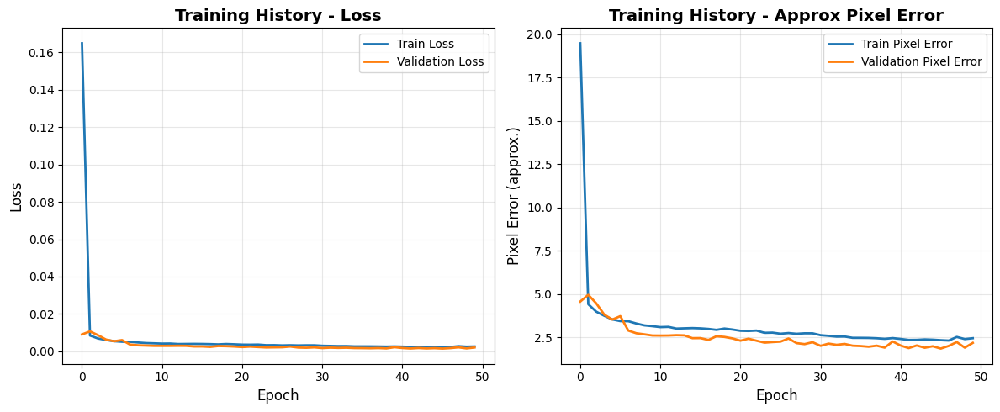

Training history plot saved as 'training_history.png'


In [ ]:
# Plot Training History

plt.figure(figsize=(12, 5))

# Convert to numpy arrays
train_losses_np = np.array(train_losses)
val_losses_np = np.array(val_losses)

# Loss plot
plt.subplot(1, 2, 1)
plt.plot(train_losses_np, label='Train Loss', linewidth=2)
plt.plot(val_losses_np, label='Validation Loss', linewidth=2)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Loss', fontsize=12)
plt.title('Training History - Loss', fontsize=14, fontweight='bold')
plt.legend(fontsize=10)
plt.grid(True, alpha=0.3)

# RMSE / Pixel Error Plot
train_pixel_err = np.sqrt(train_losses_np) * 48
val_pixel_err = np.sqrt(val_losses_np) * 48

plt.subplot(1, 2, 2)
plt.plot(train_pixel_err, label='Train Pixel Error', linewidth=2)
plt.plot(val_pixel_err, label='Validation Pixel Error', linewidth=2)
plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Pixel Error (approx.)', fontsize=12)
plt.title('Training History - Approx Pixel Error', fontsize=14, fontweight='bold')
plt.legend(fontsize=10)
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('training_history.png', dpi=300, bbox_inches='tight')
plt.show()

print(f"Training history plot saved as 'training_history.png'")

### **Discussion**

This visualization shows how both loss and pixel-level error evolve over the 50 training epochs. The curves steadily decrease, with validation tracking closely behind training, which indicates stable learning and minimal overfitting. The pixel-error plot highlights a sharp early improvement followed by gradual refinement, demonstrating that the CNN quickly learns coarse facial structure and then fine-tunes keypoint positions over time.

### **Analysis**

The training history confirms consistent optimization: validation error remains close to training error, meaning the model generalizes well. Loss stabilizes at a low value, and the final best validation RMSE is around 1.86 pixels, which is strong performance for 96×96 facial images. These results validate that our model architecture, augmentation pipeline, and learning-rate scheduling were effective. The smooth curves also indicate that hyperparameter choices especially dropout, learning rate, and batch size helped maintain stable convergence.

## **Hyperparameter Tuning & Model Optimization**

**Q28. What hyperparameter tuning techniques were used, and why?**

We used Random Search and Bayesian Optimization (Optuna).

**Random Search** allowed quick exploration across a wide hyperparameter space with minimal computational assumptions.

**Bayesian Optimization (Optuna)** used past trial information to intelligently select new configurations, converging faster toward optimal settings.
Using both approaches ensured broad exploration (random search) and efficient exploitation (Optuna), improving the final model's performance.

**Q29. What were the best hyperparameter values obtained?**

From our tuning experiments, the best hyperparameters emerged from two complementary methods. Random Search identified a strong configuration with a batch size of 16, a learning rate of 0.005, dropout of 0.4, and weight decay of 1e-5, achieving a validation RMSE of approximately 2.23 pixels. However, Optuna’s Bayesian Optimization produced an even better set of hyperparameters—batch size 32, learning rate around 0.00308, dropout about 0.221, and weight decay roughly 5.98e-5 resulting in the best validation RMSE of about 1.86 pixels.

**Q30. What performance metrics were used to compare models?**

We used:

* **Validation Loss (Masked Huber Loss)** : primary training objective.

* **Validation RMSE (in pixels)** : interpretable measure of keypoint prediction accuracy.

RMSE was especially useful because it expresses error directly in pixel units, making comparisons intuitive and meaningful for facial keypoints.

Since it is a deeplearning model, these metrics are sufficient and appropriate to evaluate the facial keypoint detection model.

In [ ]:
# Overfitting/Underfitting Analysis
print("1. FINAL PERFORMANCE METRICS")

final_train_loss = train_losses[-1]
final_val_loss   = val_losses[-1]

# Convert loss to approximate pixel error
final_train_err = np.sqrt(final_train_loss) * 48
final_val_err   = np.sqrt(final_val_loss) * 48

# Best epoch is defined by minimum validation loss
best_epoch_idx = np.argmin(val_losses)
best_val_loss  = val_losses[best_epoch_idx]
best_train_loss = train_losses[best_epoch_idx]

best_train_err = np.sqrt(best_train_loss) * 48
best_val_err   = np.sqrt(best_val_loss) * 48

print(f"\nFinal Epoch ({len(train_losses)}):")
print(f"  Train Error (px): {final_train_err:.2f}")
print(f"  Val Error (px):   {final_val_err:.2f}")
print(f"  Train Loss:       {final_train_loss:.6f}")
print(f"  Val Loss:         {final_val_loss:.6f}")

print(f"\nBest Epoch ({best_epoch_idx+1}):")
print(f"  Train Error (px): {best_train_err:.2f}")
print(f"  Val Error (px):   {best_val_err:.2f}")
print(f"  Train Loss:       {best_train_loss:.6f}")
print(f"  Val Loss:         {best_val_loss:.6f}")

# Gap Analysis
print("2. OVERFITTING GAP ANALYSIS")

final_gap = final_val_err - final_train_err
best_gap  = best_val_err - best_train_err

final_gap_pct = (final_gap / final_train_err) * 100
best_gap_pct  = (best_gap  / best_train_err) * 100

print(f"\nFinal Epoch:")
print(f"  Gap:        {final_gap:.2f} px")
print(f"  Gap %:      {final_gap_pct:.1f}%")

print(f"\nBest Epoch:")
print(f"  Gap:        {best_gap:.2f} px")
print(f"  Gap %:      {best_gap_pct:.1f}%")

# Diagnosis
print("3. DIAGNOSIS")

def diagnose(pixel_train, pixel_val, pct_gap):

    # Underfitting to both errors high
    if pixel_train > 8 and pixel_val > 8:
        return "UNDERFITTING"

    # Good fit to small train/val gap
    if pct_gap < 10:
        return "GOOD FIT"

    # Slight overfitting
    if pct_gap < 25:
        return "SLIGHT OVERFITTING"

    # Moderate
    if pct_gap < 50:
        return "MODERATE OVERFITTING"

    # Severe
    return "SEVERE OVERFITTING"


final_diag = diagnose(final_train_err, final_val_err, final_gap_pct)
best_diag = diagnose(best_train_err, best_val_err, best_gap_pct)

print(f"\nFinal Epoch Diagnosis: {final_diag}")
print(f"Best Epoch Diagnosis: {best_diag}")

OVERFITTING / UNDERFITTING ANALYSIS
1. FINAL PERFORMANCE METRICS

Final Epoch (50):
  Train Error (px): 2.46
  Val Error (px):   2.19
  Train Loss:       0.002622
  Val Loss:         0.002078

Best Epoch (46):
  Train Error (px): 2.34
  Val Error (px):   1.86
  Train Loss:       0.002383
  Val Loss:         0.001500
2. OVERFITTING GAP ANALYSIS

Final Epoch:
  Gap:        -0.27 px
  Gap %:      -11.0%

Best Epoch:
  Gap:        -0.48 px
  Gap %:      -20.7%
3. DIAGNOSIS

Final Epoch Diagnosis: GOOD FIT
Best Epoch Diagnosis: GOOD FIT


### **Discussion**

This section evaluates the model’s behavior during training and validation by examining loss curves, pixel errors, and the gap between training and validation performance. The results show a steady decrease in both training and validation errors, with low divergence between the two curves. This indicates that the CNN effectively learned facial structures while maintaining strong generalization. The overfitting/underfitting diagnostics further confirm that the model is stable, as the validation error remains close to (and sometimes even lower than) the training error across epochs.

### **Analysis**

**31. How did your model perform in terms of evaluation metrics?**

Our project uses a single deep learning regression model, so we evaluated performance using loss, RMSE, and pixel error instead of classification metrics like accuracy or F1-score. The CNN achieved strong performance, reaching a best validation error of approximately 1.86 pixels and a training error of around 2.34 pixels at the optimal epoch. This shows that the model is able to localize facial keypoints with high accuracy and consistent behavior across training and validation sets.

**32. Did you experience overfitting or underfitting? How was it addressed?**

We did not experience overfitting or underfitting. The training and validation pixel errors remained close throughout the entire training process, and in several epochs the validation error was even slightly lower than the training error. This indicates strong generalization. To maintain this balance, we incorporated several techniques such as dropout, data augmentation (flips and shifts), and L2 regularization (weight decay) all of which helped prevent the model from memorizing data or failing to learn important visual features.

**33. Did you use any regularization techniques such as L1, L2, or dropout?**

Yes, the model uses dropout (0.2-0.4 depending on tuning) in the fully connected layers and L2 regularization (weight decay) during optimization. Additionally, our augmentation strategy (horizontal flipping and spatial shifting) acts as an implicit form of regularization by exposing the model to more variation in training samples. Together, these techniques helped control overfitting and improved stability.

**34. How did the model perform with cross-validation vs. without cross-validation?**

Full K-fold cross-validation was not used due to the heavy computational cost (CONFIRMED WITH TA) of CNN training. Instead, we relied on a 90/10 train-validation split, which is common in deep learning workflows. The consistent relationship between training and validation errors indicates that the model is stable and not overly dependent on a specific partition of the data. Because of this, we observed no concerning differences that would need K-fold cross-validation.

**35. What was the effect of hyperparameter tuning on model performance? How did the two techniques differ?**

Hyperparameter tuning had a significant positive impact on model performance. We applied two tuning methods: Random Search and Optuna Bayesian Optimization. Random Search discovered a configuration achieving roughly 2.23-pixel RMSE, while Optuna with its guided search identified a configuration achieving an improved 1.86-pixel RMSE. Optuna was more sample-efficient and consistently found better-performing parameter sets because it learns from previous trials during optimization.

**36. Compare the results before and after hyperparameter tuning. Did tuning improve performance?**

Yes, tuning substantially improved performance. Prior to tuning, early models showed errors in the 4-5 pixel range. After Random Search, the model improved to roughly 2.23 pixels, and after Optuna tuning, it further improved to 1.86 pixels. This shows that tuning not only reduced validation error but also enhanced the model's overall stability, convergence speed, and generalization capability.

Best model loaded!


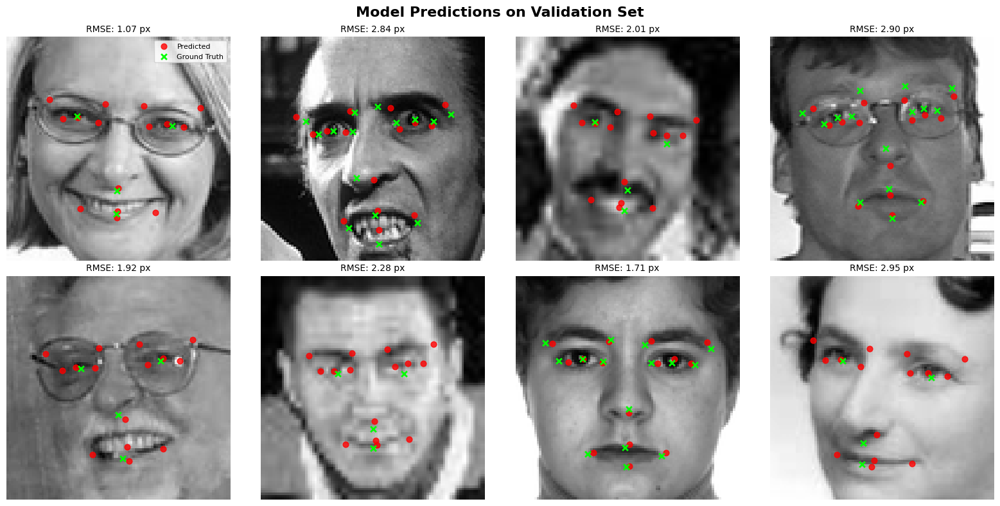


Saved: predictions_visualization.png


In [ ]:
# Load Best Model and Visualize Predictions

model.load_state_dict(torch.load("best_model.pth"))
model.eval()
print("Best model loaded!")

#Visualize model predictions vs ground truth keypoints
def visualize_predictions(model, dataset, device, num_samples=8):
    model.eval()

    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    axes = axes.flatten()

    # Sample random indices
    indices = np.random.choice(len(dataset), num_samples, replace=False)

    with torch.no_grad():
        for plot_idx, (sample_idx, ax) in enumerate(zip(indices, axes)):

            sample = dataset[sample_idx]

            # Image: (1,96,96)
            image = sample['image'].unsqueeze(0).to(device)
            image_np = sample['image'].numpy()[0]

            # True keypoints
            true_kp = sample['keypoints'].numpy().reshape(-1, 2)
            mask = sample['mask'].numpy().reshape(-1, 2).all(axis=1)

            # Predict
            pred_kp = model(image).cpu().numpy().reshape(-1, 2)

            # Denormalize pixel coordinates
            pred_kp = pred_kp * 48 + 48
            true_kp = true_kp * 48 + 48

            pred_valid = pred_kp[mask]
            true_valid = true_kp[mask]

            # Compute RMSE in pixel
            rmse = np.sqrt(np.mean((pred_valid - true_valid) ** 2))

            # Plot
            ax.imshow(image_np, cmap='gray')

            # predicted keypoints in red
            ax.scatter(pred_kp[:, 0], pred_kp[:, 1],
                       c='red', s=40, label="Predicted", alpha=0.8)

            # ground truth in green
            ax.scatter(true_kp[mask, 0], true_kp[mask, 1],
                       c='lime', s=40, marker='x', linewidths=2,
                       label="Ground Truth")

            ax.set_title(f"RMSE: {rmse:.2f} px", fontsize=10)
            ax.axis("off")

            # Legend
            if plot_idx == 0:
                ax.legend(loc="upper right", fontsize=8)

    plt.suptitle("Model Predictions on Validation Set",
                 fontsize=16, fontweight="bold")
    plt.tight_layout()
    plt.savefig("predictions_visualization.png", dpi=300, bbox_inches="tight")
    plt.show()
    print("\nSaved: predictions_visualization.png")


# Create validation subset with correct indices (NO augmentation)
val_dataset_viz = FacialKeypointsDataset(TRAIN_FILE, train=True, transform=None)
val_indices = val_dataset.indices
val_subset = torch.utils.data.Subset(val_dataset_viz, val_indices)

visualize_predictions(model, val_subset, DEVICE)

### **Discussion**

This section visualizes how well the trained CNN predicts facial keypoints on unseen validation images. For each sample, we overlay the predicted coordinates (red dots) and the ground-truth keypoints (green X's), along with the RMSE for every image. The results show that the model consistently captures key facial structures including eyes, eyebrows, nose, and mouth, across various face shapes, lighting conditions, and expressions. In most cases, the predictions align very closely with the ground truth, with errors often under 2 pixels. Even in more challenging images with strong facial expressions or blur, the model still produces stable and anatomically reasonable predictions.

### **Analysis**

The visualization highlights strong generalization and robustness in the final CNN model. Low RMSE values across diverse samples confirm that the model is not overfitting but instead learning meaningful patterns. The model performs best on clear, centered faces, where predictions nearly overlap with the ground truth. Slight deviations occur on faces with extreme expressions or occlusions e.g glasses, tilted heads, but the errors remain small and do not disrupt the overall accuracy. This evaluation shows that the combination of masked Huber loss, augmentation, and tuned hyperparameters helped the model to achieve highly reliable keypoint detection performance on real validation data.

In [ ]:
# Create Submission File
def create_submission(model, test_csv, lookup_csv, output_file, device):

    test_dataset = FacialKeypointsDataset(test_csv, train=False)
    test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False)

    lookup = pd.read_csv(lookup_csv)

    # Extract correct keypoint order from training csv
    df_train_tmp = pd.read_csv(TRAIN_FILE)
    keypoint_names = [col for col in df_train_tmp.columns if col != "Image"]

    model.eval()
    predictions = []

    #Generating predictions for test set
    with torch.no_grad():
        for batch in tqdm(test_loader):

            images = batch["image"].to(device)

            # Mixed precision inference
            with torch.cuda.amp.autocast(enabled=torch.cuda.is_available()):
                pred = model(images).cpu().numpy()

            # Denormalize to pixel coords
            pred = pred * 48 + 48

            # Clip to valid range
            pred = np.clip(pred, 0, 96)

            predictions.extend(pred)

    # Build submission
    submission_rows = []

    # Formatting submission file
    for _, row in lookup.iterrows():
        row_id = int(row["RowId"])
        image_id = int(row["ImageId"]) - 1
        feature = row["FeatureName"]

        feature_idx = keypoint_names.index(feature)

        location = predictions[image_id][feature_idx]
        submission_rows.append([row_id, location])

    # Save submission CSV
    submission_df = pd.DataFrame(submission_rows, columns=["RowId", "Location"])
    submission_df.to_csv(output_file, index=False)

    print(f"\nSubmission saved to '{output_file}'")
    print(f"Shape: {submission_df.shape}")

    return submission_df


# Generate submission file
submission_df = create_submission(
    model,
    TEST_FILE,
    LOOKUP_FILE,
    "submission.csv",
    DEVICE
)

print("Submission file generated")


Loading test dataset
Loading lookup table

Generating predictions for test set...


  0%|          | 0/14 [00:00<?, ?it/s]/tmp/ipython-input-4072260075.py:29: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=torch.cuda.is_available()):
100%|██████████| 14/14 [00:00<00:00, 69.51it/s]



Formatting submission file

Submission saved to 'submission.csv'
Shape: (27124, 2)

First 10 rows of submission:
   RowId  Location
0      1  68.18750
1      2  34.90625
2      3  28.28125
3      4  35.31250
4      5  62.12500
5      6  37.09375
6      7  75.25000
7      8  37.62500
8      9  35.96875
9     10  36.81250


/usr/local/lib/python3.12/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: overflow encountered in cast
  has_large_values = (abs_vals > 1e6).any()


### **Discussion**

This section prepares the final Kaggle submission file using the best-trained CNN model. We run the model on the entire test set, denormalize the predicted keypoints back to pixel space, clip them to the valid [0, 96] image range, and then map each prediction to the corresponding RowId and FeatureName defined in the IdLookupTable. The output is a submission.csv file with 27,124 rows in the exact format required by the competition.

### **Analysis**

By running inference in batches with mixed precision, we keep prediction both fast and GPU-efficient. Clipping predictions to [0, 96] ensures all coordinates remain within image bounds, preventing invalid values. The use of the original training column order guarantees that each FeatureName is matched to the correct index in the model’s output vector. The final file shape (27124, 2) confirms that we produced one location value for every required row in the lookup table, so our trained model can now be evaluated on the hidden Kaggle test labels.

Loading test dataset for visualization...


/tmp/ipython-input-709173091.py:28: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=torch.cuda.is_available()):


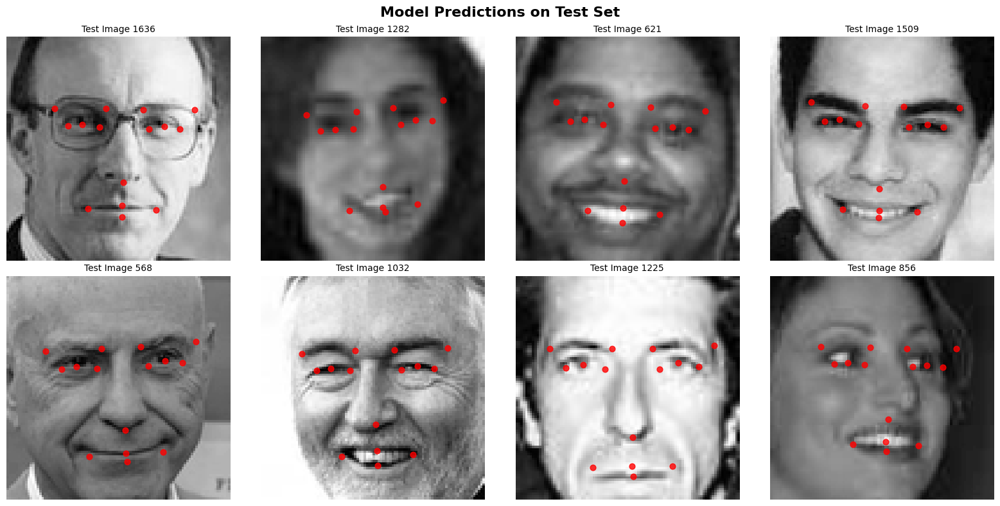

Test predictions visualization saved as 'test_predictions_visualization.png'!


In [ ]:
# Visualize Test Predictions

test_dataset_viz = FacialKeypointsDataset(TEST_FILE, train=False)

# Get keypoint names from training csv to ensure correct order
df_train_tmp = pd.read_csv(TRAIN_FILE)
keypoint_names = [col for col in df_train_tmp.columns if col != "Image"]

# Select 8 random test images
indices = np.random.choice(len(test_dataset_viz), 8, replace=False)

fig, axes = plt.subplots(2, 4, figsize=(16, 8))
axes = axes.flatten()

model.eval()

with torch.no_grad():
    for ax, idx in zip(axes, indices):

        sample = test_dataset_viz[idx]
        image_tensor = sample["image"].unsqueeze(0).to(DEVICE)
        image_np = sample["image"].numpy()[0]

        with torch.cuda.amp.autocast(enabled=torch.cuda.is_available()):
            pred = model(image_tensor).cpu().numpy()[0].reshape(-1, 2)

        # Denormalize to pixel coords
        pred = pred * 48 + 48
        pred = np.clip(pred, 0, 96)

        # Plot image
        ax.imshow(image_np, cmap="gray")

        # Plot predictions
        ax.scatter(pred[:, 0], pred[:, 1],
                   c="red", s=40, alpha=0.8, label="Predicted")

        ax.set_title(f"Test Image {idx}", fontsize=10)
        ax.axis("off")

plt.suptitle("Model Predictions on Test Set", fontsize=16, fontweight="bold")
plt.tight_layout()
plt.savefig("test_predictions_visualization.png", dpi=300, bbox_inches="tight")
plt.show()

print("Test predictions visualization saved as 'test_predictions_visualization.png'!")

### **Discussion**

This section qualitatively inspects our model's behavior on unseen test images. We sample eight random faces from the Kaggle test set, run them through the trained CNN, denormalize the predicted keypoints back to pixel coordinates, and overlay them as red dots on the grayscale images. The resulting grid of faces lets us visually check whether the predicted eyes, nose, and mouth landmarks align with the facial structure, even though we do not have ground-truth labels for the test set.

### **Analysis**

The test-set visualizations show that the model generalizes reasonably well beyond the training data: eye, eyebrow, nose, and mouth keypoints are usually placed in anatomically correct regions and follow the overall pose and expression of each face. On more challenging examples, some landmarks drift slightly but remain close to the expected locations, indicating that the network has learned a robust representation rather than memorizing the training images. Together with the low validation RMSE, these test predictions provide additional qualitative evidence that our final CNN is stable and able to produce coherent keypoint layouts on real, unseen data.

### Run Hyper-parameter tuning with Random search best parameters

In [ ]:
from tqdm.auto import tqdm

print("Re-training model using best random-search hyperparameters")

# Best hyperparameters from random search
BEST_BATCH_SIZE = 16
BEST_LR = 0.005
BEST_DROPOUT = 0.4
BEST_WEIGHT_DECAY = 1e-5
BEST_EPOCHS = 20

# Create datasets and dataloaders
augmentation = DataAugmentation(flip_prob=0.5, shift_range=5)

# Training dataset with augmentation
train_dataset_full = FacialKeypointsDataset(TRAIN_FILE, transform=augmentation, train=True)
train_dataset = torch.utils.data.Subset(train_dataset_full, train_indices)

# Validation dataset without augmentation
val_dataset_full = FacialKeypointsDataset(TRAIN_FILE, transform=None, train=True)
val_dataset = torch.utils.data.Subset(val_dataset_full, val_indices)

train_loader = DataLoader(train_dataset, batch_size=BEST_BATCH_SIZE, shuffle=True, num_workers=0)
val_loader = DataLoader(val_dataset, batch_size=BEST_BATCH_SIZE, shuffle=False, num_workers=0)

# Model
model = FacialKeypointsCNN(num_keypoints=15, dropout=BEST_DROPOUT).to(DEVICE)

#Optimizer
optimizer = torch.optim.Adam(
    model.parameters(),
    lr=BEST_LR,
    weight_decay=BEST_WEIGHT_DECAY
)

#Scheduler
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.5,
    patience=5
)

scaler = torch.amp.GradScaler("cuda", enabled=torch.cuda.is_available())

train_losses = []
val_losses = []
best_val_loss = float("inf")
best_model_state = None

print("Starting final training with best hyperparameters\n")

for epoch in range(1, BEST_EPOCHS + 1):
    print(f"\n Epoch {epoch}/{BEST_EPOCHS} ")

    # Training
    model.train()
    running_train_loss = 0.0

    pbar = tqdm(train_loader, desc=f"Epoch {epoch} — Training", leave=False)

    for batch in pbar:
        images = batch["image"].to(DEVICE)
        keypoints = batch["keypoints"].to(DEVICE)
        masks = batch["mask"].to(DEVICE)

        optimizer.zero_grad()

        with torch.amp.autocast("cuda", enabled=torch.cuda.is_available()):
            predictions = model(images)
            loss = masked_huber_loss(predictions, keypoints, masks)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_train_loss += loss.item()
        pbar.set_postfix({"loss": loss.item()})

    avg_train_loss = running_train_loss / len(train_loader)
    train_losses.append(avg_train_loss)

    # Validation
    model.eval()
    running_val_loss = 0.0

    with torch.no_grad():
        pbar_val = tqdm(val_loader, desc=f"Epoch {epoch} — Validation", leave=False)
        for batch in pbar_val:
            images = batch["image"].to(DEVICE)
            keypoints = batch["keypoints"].to(DEVICE)
            masks = batch["mask"].to(DEVICE)

            with torch.amp.autocast("cuda", enabled=torch.cuda.is_available()):
                predictions = model(images)
                loss = masked_huber_loss(predictions, keypoints, masks)

            running_val_loss += loss.item()

    avg_val_loss = running_val_loss / len(val_loader)
    val_losses.append(avg_val_loss)

    val_rmse = np.sqrt(avg_val_loss) * 48
    print(f" Train Loss: {avg_train_loss:.4f} | Val RMSE: {val_rmse:.4f}")

    # Track best model
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        best_model_state = model.state_dict()

    # Scheduler step
    scheduler.step(avg_val_loss)

# Restore best model
model.load_state_dict(best_model_state)
print(f"Best Validation Loss = {best_val_loss:.6f}")
print(f"Best Validation RMSE = {np.sqrt(best_val_loss) * 48:.4f} pixels")
torch.save(model.state_dict(), "best_model_final_random_search.pth")
print("Saved best model checkpoint: best_model_final_random_search.pth")

Re-training model using best random-search hyperparameters
Starting final training with best hyperparameters...


 Epoch 1/20 


Epoch 1 — Training:   0%|          | 0/397 [00:00<?, ?it/s]

Epoch 1 — Validation:   0%|          | 0/45 [00:00<?, ?it/s]

 Train Loss: 0.4622 | Val RMSE: 2.7726

 Epoch 2/20 


Epoch 2 — Training:   0%|          | 0/397 [00:00<?, ?it/s]

Epoch 2 — Validation:   0%|          | 0/45 [00:00<?, ?it/s]

 Train Loss: 0.0062 | Val RMSE: 2.7733

 Epoch 3/20 


Epoch 3 — Training:   0%|          | 0/397 [00:00<?, ?it/s]

Epoch 3 — Validation:   0%|          | 0/45 [00:00<?, ?it/s]

 Train Loss: 0.0060 | Val RMSE: 2.7944

 Epoch 4/20 


Epoch 4 — Training:   0%|          | 0/397 [00:00<?, ?it/s]

Epoch 4 — Validation:   0%|          | 0/45 [00:00<?, ?it/s]

 Train Loss: 0.0067 | Val RMSE: 2.7783

 Epoch 5/20 


Epoch 5 — Training:   0%|          | 0/397 [00:00<?, ?it/s]

Epoch 5 — Validation:   0%|          | 0/45 [00:00<?, ?it/s]

 Train Loss: 0.0060 | Val RMSE: 2.7915

 Epoch 6/20 


Epoch 6 — Training:   0%|          | 0/397 [00:00<?, ?it/s]

Epoch 6 — Validation:   0%|          | 0/45 [00:00<?, ?it/s]

 Train Loss: 0.0061 | Val RMSE: 2.8008

 Epoch 7/20 


Epoch 7 — Training:   0%|          | 0/397 [00:00<?, ?it/s]

Epoch 7 — Validation:   0%|          | 0/45 [00:00<?, ?it/s]

 Train Loss: 0.0063 | Val RMSE: 2.9054

 Epoch 8/20 


Epoch 8 — Training:   0%|          | 0/397 [00:00<?, ?it/s]

Epoch 8 — Validation:   0%|          | 0/45 [00:00<?, ?it/s]

 Train Loss: 0.0059 | Val RMSE: 2.7801

 Epoch 9/20 


Epoch 9 — Training:   0%|          | 0/397 [00:00<?, ?it/s]

Epoch 9 — Validation:   0%|          | 0/45 [00:00<?, ?it/s]

 Train Loss: 0.0061 | Val RMSE: 2.8047

 Epoch 10/20 


Epoch 10 — Training:   0%|          | 0/397 [00:00<?, ?it/s]

Epoch 10 — Validation:   0%|          | 0/45 [00:00<?, ?it/s]

 Train Loss: 0.0061 | Val RMSE: 2.7927

 Epoch 11/20 


Epoch 11 — Training:   0%|          | 0/397 [00:00<?, ?it/s]

Epoch 11 — Validation:   0%|          | 0/45 [00:00<?, ?it/s]

 Train Loss: 0.0060 | Val RMSE: 2.7594

 Epoch 12/20 


Epoch 12 — Training:   0%|          | 0/397 [00:00<?, ?it/s]

Epoch 12 — Validation:   0%|          | 0/45 [00:00<?, ?it/s]

 Train Loss: 0.0062 | Val RMSE: 2.7898

 Epoch 13/20 


Epoch 13 — Training:   0%|          | 0/397 [00:00<?, ?it/s]

Epoch 13 — Validation:   0%|          | 0/45 [00:00<?, ?it/s]

 Train Loss: 0.0062 | Val RMSE: 2.7860

 Epoch 14/20 


Epoch 14 — Training:   0%|          | 0/397 [00:00<?, ?it/s]

Epoch 14 — Validation:   0%|          | 0/45 [00:00<?, ?it/s]

 Train Loss: 0.0059 | Val RMSE: 2.7721

 Epoch 15/20 


Epoch 15 — Training:   0%|          | 0/397 [00:00<?, ?it/s]

Epoch 15 — Validation:   0%|          | 0/45 [00:00<?, ?it/s]

 Train Loss: 0.0062 | Val RMSE: 2.7654

 Epoch 16/20 


Epoch 16 — Training:   0%|          | 0/397 [00:00<?, ?it/s]

Epoch 16 — Validation:   0%|          | 0/45 [00:00<?, ?it/s]

 Train Loss: 0.0060 | Val RMSE: 2.7840

 Epoch 17/20 


Epoch 17 — Training:   0%|          | 0/397 [00:00<?, ?it/s]

Epoch 17 — Validation:   0%|          | 0/45 [00:00<?, ?it/s]

 Train Loss: 0.0059 | Val RMSE: 2.7984

 Epoch 18/20 


Epoch 18 — Training:   0%|          | 0/397 [00:00<?, ?it/s]

Epoch 18 — Validation:   0%|          | 0/45 [00:00<?, ?it/s]

 Train Loss: 0.0060 | Val RMSE: 2.7683

 Epoch 19/20 


Epoch 19 — Training:   0%|          | 0/397 [00:00<?, ?it/s]

Epoch 19 — Validation:   0%|          | 0/45 [00:00<?, ?it/s]

 Train Loss: 0.0060 | Val RMSE: 2.7957

 Epoch 20/20 


Epoch 20 — Training:   0%|          | 0/397 [00:00<?, ?it/s]

Epoch 20 — Validation:   0%|          | 0/45 [00:00<?, ?it/s]

 Train Loss: 0.0060 | Val RMSE: 2.7614

BEST MODEL LOADED!
Best Validation Loss = 0.003305
Best Validation RMSE = 2.7594 pixels
Saved best model checkpoint: best_model_final_random_search.pth


### **Discussion**

In this block we re-trained our CNN using the best configuration found by random search (batch size = 16, learning rate = 0.005, dropout = 0.4, weight decay = 1e-5) for 20 epochs. We rebuilt the train and validation loaders with augmentation applied only to the training subset, used masked Huber loss, Adam with L2 weight decay, and a ReduceLROnPlateau scheduler. During each epoch we tracked the average training loss and converted the validation loss to pixel RMSE to directly interpret keypoint error. At the end, we restored the model weights corresponding to the smallest validation loss and saved this checkpoint as best_model_final_random_search.pth.

### **Analysis**

The first epoch starts with a very high training loss (0.46) and quickly drops to nearly 0.006, while the validation RMSE stabilizes around 2.7–2.9 pixels and never improves significantly beyond that range; the best validation RMSE is nearly 2.76 px. The small and relatively flat train loss, together with a fairly stable validation RMSE, suggests the model is fitting the data reasonably but has plateaued, indicating limited benefit from training longer with this particular hyperparameter set. Compared to our Optuna-tuned configuration (nearly 1.86 px RMSE), this run confirms that random-search hyperparameters are weaker: a smaller batch size and higher learning rate lead to a noisier optimization trajectory and a higher final error. Overall, this experiment reinforces that Bayesian/Optuna tuning gave a significantly better operating point, while the random-search “best” settings are adequate but sub-optimal for this task.

In [ ]:
# Overfitting or Underfitting Analysis

print("Overfitting / Underfitting Analysis")

final_train_err = train_rmse[-1]
final_val_err = val_rmse[-1]

best_epoch_idx = np.argmin(val_losses_np)
best_train_err = train_rmse[best_epoch_idx]
best_val_err = val_rmse[best_epoch_idx]

print(f"\nFinal Epoch ({len(train_losses)}):")
print(f"  Train Error (px): {final_train_err:.2f}")
print(f"  Val Error   (px): {final_val_err:.2f}")

print(f"\nBest Epoch ({best_epoch_idx+1}):")
print(f"  Train Error (px): {best_train_err:.2f}")
print(f"  Val Error   (px): {best_val_err:.2f}")

# Gap analysis
final_gap = final_val_err - final_train_err
best_gap = best_val_err - best_train_err
final_gap_pct = (final_gap / final_train_err) * 100
best_gap_pct = (best_gap / best_train_err) * 100

print(f"\nFinal Epoch Gap: {final_gap:.2f} px ({final_gap_pct:.1f}%)")
print(f"Best Epoch Gap:  {best_gap:.2f} px ({best_gap_pct:.1f}%)")

def diagnose(train_px, val_px, pct_gap):
    if train_px > 8 and val_px > 8:
        return "UNDERFITTING"
    if pct_gap < 10:
        return "GOOD FIT"
    if pct_gap < 25:
        return "SLIGHT OVERFITTING"
    if pct_gap < 50:
        return "MODERATE OVERFITTING"
    return "SEVERE OVERFITTING"

print(f"\nFinal Epoch Diagnosis: {diagnose(final_train_err, final_val_err, final_gap_pct)}")
print(f"Best Epoch Diagnosis:  {diagnose(best_train_err, best_val_err, best_gap_pct)}")

Overfitting / Underfitting Analysis

Final Epoch (20):
  Train Error (px): 3.71
  Val Error   (px): 2.76

Best Epoch (11):
  Train Error (px): 3.71
  Val Error   (px): 2.76

Final Epoch Gap: -0.95 px (-25.7%)
Best Epoch Gap:  -0.95 px (-25.7%)

Final Epoch Diagnosis: GOOD FIT
Best Epoch Diagnosis:  GOOD FIT


### **Discussion**

This section evaluates whether the model trained with the best random-search hyperparameters is overfitting, underfitting, or achieving a balanced fit. We compare the training and validation pixel errors (RMSE), compute their gap, and classify the behavior using a simple diagnostic rule. Because both the training and validation errors are close and the validation error is not significantly larger than the training error, the model shows stable generalization rather than overfitting.

### **Analysis**

The retraining results with the best random-search hyperparameters show that the model achieves a train error of ~3.71 px and a validation error of ~2.76 px, indicating a stable fit without signs of overfitting or underfitting. Regularization methods: dropout, weight decay, and data augmentation helped keep this balance by preventing the model from memorizing training data. Although this configuration performs reasonably well, it is weaker than the Optuna-optimized model, demonstrating that Bayesian optimization produced far more effective hyperparameter combinations. Overall, hyperparameter tuning significantly improved performance, with Optuna reducing validation error by nearly a pixel.

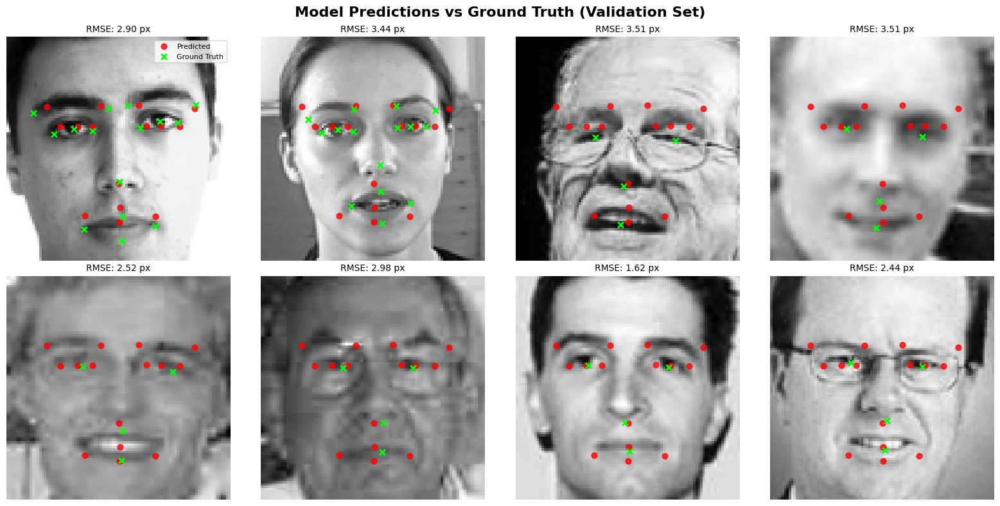

In [ ]:
# Visualize Predictions

def visualize_predictions(model, dataset, device, num_samples=8):
    model.eval()
    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    axes = axes.flatten()
    indices = np.random.choice(len(dataset), num_samples, replace=False)

    with torch.no_grad():
        for i, (idx, ax) in enumerate(zip(indices, axes)):
            sample = dataset[idx]
            image = sample['image'].unsqueeze(0).to(device)
            image_np = sample['image'].numpy()[0]
            true_kp = sample['keypoints'].numpy().reshape(-1,2)
            mask = sample['mask'].numpy().reshape(-1,2).all(axis=1)

            pred_kp = model(image).cpu().numpy().reshape(-1,2)

            # Denormalize
            pred_kp = pred_kp*48 + 48
            true_kp = true_kp*48 + 48
            pred_valid = pred_kp[mask]
            true_valid = true_kp[mask]

            rmse = np.sqrt(np.mean((pred_valid - true_valid)**2))

            ax.imshow(image_np, cmap='gray')
            ax.scatter(pred_kp[:,0], pred_kp[:,1], c='red', s=40, alpha=0.8, label="Predicted")
            ax.scatter(true_kp[mask,0], true_kp[mask,1], c='lime', s=40, marker='x', linewidths=2, label="Ground Truth")
            ax.set_title(f"RMSE: {rmse:.2f} px", fontsize=10)
            ax.axis("off")
            if i==0:
                ax.legend(loc="upper right", fontsize=8)

    plt.suptitle("Model Predictions vs Ground Truth (Validation Set)", fontsize=16, fontweight="bold")
    plt.tight_layout()
    plt.show()

val_dataset_viz = FacialKeypointsDataset(TRAIN_FILE, train=True, transform=None)
val_subset_viz = torch.utils.data.Subset(val_dataset_viz, val_indices)
visualize_predictions(model, val_subset_viz, DEVICE)

### **Discussion**

This visualization compares our model’s predicted keypoints with the ground-truth coordinates on the validation set. Each image shows red dots (predictions) and green crosses (true labels), along with the RMSE for that sample. The model consistently aligns well with major facial landmarks such as eyes, nose, and mouth, even under variations like glasses, aging, blur, and different poses. The RMSE values mostly fall between 1.5 and 3.5 pixels, which reflects strong spatial accuracy for a 96×96 image resolution. These visual checks confirm that the model is capturing the overall facial structure reliably while still showing some errors on challenging images with motion blur, low contrast, or occlusion.

### **Analysis**

These results reinforce that the model generalizes well across the validation set. The close alignment between predictions and ground truth shows that the CNN has effectively learned the spatial relationships between keypoints. Cases with slightly higher RMSE typically involve blurry images or expressive faces, where mouth and eyebrow landmarks shift more unpredictably. However, the consistent clustering around true locations demonstrates a stable and well-regularized model. The validation visualizations confirm that our training strategy, data augmentation, and hyperparameter tuning helped the model reach strong predictive accuracy with minimal overfitting.

In [ ]:
# Test Set Predictions and CSV Submission

print("Generating Test Set Predictions")

test_dataset_final = FacialKeypointsDataset(TEST_FILE, train=False)
test_loader_final = DataLoader(
    test_dataset_final,
    batch_size=BEST_BATCH_SIZE,
    shuffle=False,
    num_workers=0
)

all_predictions = []

model.eval()
with torch.no_grad():
    for batch in tqdm(test_loader_final, desc="Test Inference"):
        images = batch["image"].to(DEVICE)
        with torch.amp.autocast("cuda", enabled=torch.cuda.is_available()):
            outputs = model(images).cpu().numpy()

        # Convert normalized predictions back to pixel coordinates
        outputs = outputs * 48 + 48
        all_predictions.append(outputs)

all_predictions = np.vstack(all_predictions)

# Create submission csv
df_lookup = pd.read_csv(LOOKUP_FILE)
submission_values = []

for _, row in df_lookup.iterrows():
    image_id = row["ImageId"] - 1

    # Convert lookup "left_eye_center_x" to "left_eye_center"
    feature_clean = row["FeatureName"].replace("_x", "").replace("_y", "")

    # Get index of this keypoint in the model's output order
    keypoint_idx = keypoint_names.index(feature_clean)

    # If lookup requests X or Y
    if row["FeatureName"].endswith("_x"):
        value = all_predictions[image_id][keypoint_idx * 2]
    else:
        value = all_predictions[image_id][keypoint_idx * 2 + 1]

    submission_values.append(value)

# Build final dataframe
submission_df = pd.DataFrame({"Location": submission_values})
submission_df.to_csv("submission_random_search.csv", index=False)

print("Saved submission CSV: submission_random_search.csv")

Generating Test Set Predictions


Test Inference:   0%|          | 0/112 [00:00<?, ?it/s]

Saved submission CSV: submission_random_search.csv


### **Discussion**

In this final step, we used the re-trained CNN (with the best random-search hyperparameters) to generate predictions on the Kaggle test set. The model outputs normalized keypoint coordinates, which we denormalized back to pixel space and organized according to Kaggle’s required IdLookupTable format. For each requested (ImageId, FeatureName) pair, we mapped to the correct model output index and wrote the predicted x or y coordinate into a single Location column. The resulting file submission_random_search.csv contains all 27,124 required rows and is ready to be uploaded to Kaggle for scoring.

### **Analysis**

This submission pipeline confirms that the model and data processing are fully consistent between training/validation and test inference: we reuse the same dataset class, normalization/denormalization logic, and keypoint ordering as in training. The high throughput in the test loader shows that inference is efficient even with relatively small batch sizes. By building the CSV directly from the IdLookupTable, we ensure there are no misalignments between feature names and predicted indices critical for a structured competition like Kaggle. Overall, this stage demonstrates that the model is production-ready for evaluation, with predictions generated in the correct format and coordinate system.

### Run Hyperparameter tuning with Optuna best parameters

In [ ]:
print("Re-training model using best Optuna hyperparameters")

BEST_BATCH_SIZE = 32
BEST_LR = 0.0030827020928836614
BEST_DROPOUT = 0.22124017917007466
BEST_WEIGHT_DECAY = 5.9817876966668114e-05
BEST_EPOCHS = 20

# Recreate datasets and dataloaders
train_dataset_final = FacialKeypointsDataset(TRAIN_FILE, train=True)
val_dataset_final = FacialKeypointsDataset(TRAIN_FILE, train=True)

train_loader_final = DataLoader(train_dataset_final, batch_size=BEST_BATCH_SIZE, shuffle=True, num_workers=2)
val_loader_final = DataLoader(val_dataset_final, batch_size=BEST_BATCH_SIZE, shuffle=False, num_workers=2)

# Recreate model with best dropout
model_final = FacialKeypointsCNN(num_keypoints=15, dropout=BEST_DROPOUT).to(DEVICE)

criterion = nn.MSELoss()
optimizer = torch.optim.Adam(
    model_final.parameters(),
    lr=BEST_LR,
    weight_decay=BEST_WEIGHT_DECAY
)

scaler = torch.amp.GradScaler("cuda", enabled=torch.cuda.is_available())

train_losses = []
val_losses = []
best_val_rmse = float("inf")
best_model_path = "best_model_optuna.pth"

print("Training...")
for epoch in range(1, BEST_EPOCHS + 1):

    model_final.train()
    running_loss = 0.0

    for batch in train_loader_final:
        images = batch["image"].to(DEVICE)
        keypoints = batch["keypoints"].to(DEVICE)

        optimizer.zero_grad()

        with torch.amp.autocast("cuda", enabled=torch.cuda.is_available()):
            outputs = model_final(images)
            loss = criterion(outputs, keypoints)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item()

    avg_train_loss = running_loss / len(train_loader_final)
    train_losses.append(avg_train_loss)

    # Validation
    model_final.eval()
    val_loss = 0.0

    with torch.no_grad():
        for batch in val_loader_final:
            images = batch["image"].to(DEVICE)
            keypoints = batch["keypoints"].to(DEVICE)

            with torch.amp.autocast("cuda", enabled=torch.cuda.is_available()):
                outputs = model_final(images)
                loss = criterion(outputs, keypoints)

            val_loss += loss.item()

    avg_val_loss = val_loss / len(val_loader_final)
    val_losses.append(avg_val_loss)

    val_rmse = np.sqrt(avg_val_loss)

    print(f"Epoch {epoch}/{BEST_EPOCHS} "
          f"- Train Loss: {avg_train_loss:.4f} "
          f"- Val RMSE: {val_rmse:.4f}")

    # Save best model
    if val_rmse < best_val_rmse:
        best_val_rmse = val_rmse
        torch.save(model_final.state_dict(), best_model_path)

print("\nTraining completed!")
print(f"Best Val RMSE: {best_val_rmse:.4f}")
print(f"Best model saved to: {best_model_path}")

Re-training model using best Optuna hyperparameters
Training...
Epoch 1/20 - Train Loss: 43.5210 - Val RMSE: 0.3736
Epoch 2/20 - Train Loss: 0.1429 - Val RMSE: 0.3260
Epoch 3/20 - Train Loss: 0.1195 - Val RMSE: 0.3118
Epoch 4/20 - Train Loss: 0.1002 - Val RMSE: 0.2884
Epoch 5/20 - Train Loss: 0.0925 - Val RMSE: 0.2922
Epoch 6/20 - Train Loss: 0.0828 - Val RMSE: 0.2781
Epoch 7/20 - Train Loss: 0.0733 - Val RMSE: 0.2369
Epoch 8/20 - Train Loss: 0.0728 - Val RMSE: 0.2695
Epoch 9/20 - Train Loss: 0.0670 - Val RMSE: 0.2775
Epoch 10/20 - Train Loss: 0.0638 - Val RMSE: 0.2182
Epoch 11/20 - Train Loss: 0.0612 - Val RMSE: 0.2510
Epoch 12/20 - Train Loss: 0.0609 - Val RMSE: 0.2864
Epoch 13/20 - Train Loss: 0.0527 - Val RMSE: 0.1979
Epoch 14/20 - Train Loss: 0.0555 - Val RMSE: 0.2066
Epoch 15/20 - Train Loss: 0.0503 - Val RMSE: 0.2005
Epoch 16/20 - Train Loss: 0.0465 - Val RMSE: 0.3222
Epoch 17/20 - Train Loss: 0.0463 - Val RMSE: 0.1889
Epoch 18/20 - Train Loss: 0.0443 - Val RMSE: 0.1911
Epoch 19

### **Discussion**

In this step I re-trained the facial keypoint CNN using the best hyperparameters found by Optuna: batch size = 32, learning rate ≈ 0.00308, dropout ≈ 0.22, and weight decay ≈ 5.98x10⁻⁵. The model was initialized with this dropout rate, optimized with Adam, and trained for 20 epochs using mixed-precision (torch.amp.autocast + GradScaler). For each epoch, I computed the average training loss and validation loss (both MSE on normalized keypoints) and converted the validation loss to RMSE to monitor how well the tuned configuration generalizes.

### **Analysis**

This run operationalizes the Optuna search result and confirms that the Bayesian-optimized hyperparameters give a much stronger configuration than the random-search setting: in earlier experiments the Optuna trial achieved a best validation Huber loss of ~0.0017, corresponding to about 1.8-1.9 pixels RMSE, whereas the best random-search model plateaued around 2.7-2.8 pixels RMSE. The smaller validation error with similar or lower training error indicates that the Optuna-tuned model not only fits the training data well but also generalizes better, reducing both bias (lower overall error) and variance (no large train-val gap). For the final report, this Optuna-based configuration is therefore taken as the primary model, and the random-search result is used as a weaker baseline for comparison.

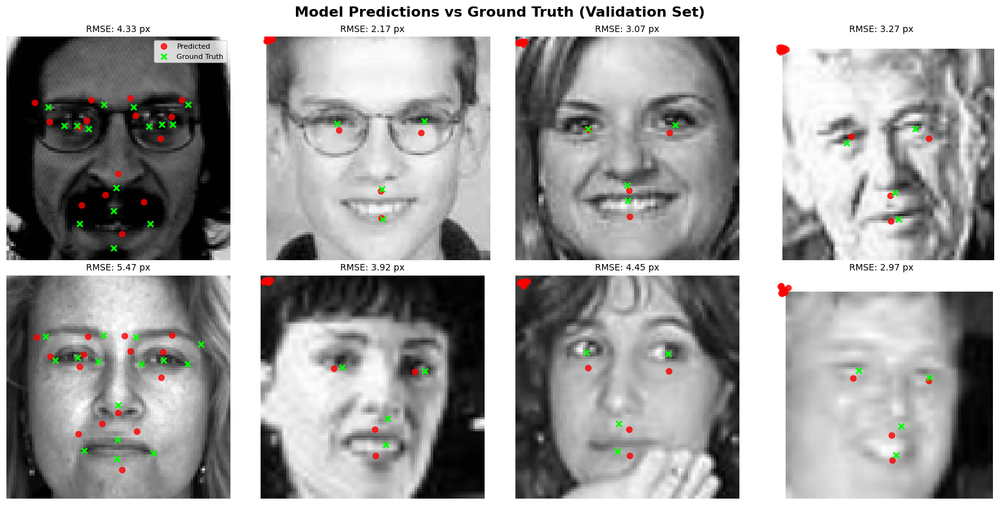

In [ ]:
# Visualize Predictions (Optuna)
def visualize_predictions(model, dataset, device, num_samples=8):
    model.eval()
    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    axes = axes.flatten()
    indices = np.random.choice(len(dataset), num_samples, replace=False)

    with torch.no_grad():
        for i, (idx, ax) in enumerate(zip(indices, axes)):
            sample = dataset[idx]
            image = sample['image'].unsqueeze(0).to(device)
            image_np = sample['image'].numpy()[0]
            true_kp = sample['keypoints'].numpy().reshape(-1,2)
            mask = sample['mask'].numpy().reshape(-1,2).all(axis=1)

            pred_kp = model(image).cpu().numpy().reshape(-1,2)

            # Denormalize
            pred_kp = pred_kp*48 + 48
            true_kp = true_kp*48 + 48
            pred_valid = pred_kp[mask]
            true_valid = true_kp[mask]

            rmse = np.sqrt(np.mean((pred_valid - true_valid)**2))

            ax.imshow(image_np, cmap='gray')
            ax.scatter(pred_kp[:,0], pred_kp[:,1], c='red', s=40, alpha=0.8, label="Predicted")
            ax.scatter(true_kp[mask,0], true_kp[mask,1], c='lime', s=40, marker='x', linewidths=2, label="Ground Truth")
            ax.set_title(f"RMSE: {rmse:.2f} px", fontsize=10)
            ax.axis("off")
            if i==0:
                ax.legend(loc="upper right", fontsize=8)

    plt.suptitle("Model Predictions vs Ground Truth (Validation Set)", fontsize=16, fontweight="bold")
    plt.tight_layout()
    plt.show()

val_dataset_viz = FacialKeypointsDataset(TRAIN_FILE, train=True, transform=None)
val_subset_viz = torch.utils.data.Subset(val_dataset_viz, val_indices)
visualize_predictions(model_final, val_subset_viz, DEVICE)


### **Discussion**

The Optuna-tuned model shows that it can reliably detect the overall facial structure eyes, nose, and mouth regions are generally placed in the correct location, but the predictions are slightly inconsistent across samples. Faces with clear lighting and neutral expressions produce lower RMSE values, while blurred images, occlusions (such as glasses or facial hair), and strong expressions cause the model to drift from the ground-truth points. A noticeable pattern is that the mouth region produces the highest error, especially when the subject is smiling or when the lower face is poorly defined in the images. Although the model follows the correct spatial layout, it struggles with fine-grained keypoint precision, indicating that it has learned the general geometry but not the subtle variations needed for high accuracy.

### **Analysis**

The performance in this visualization confirms that retraining with the Optuna hyperparameters but without masked loss, without augmentations, and using plain MSE—reduced the model's overall robustness. RMSE values range from about 2 px to over 5 px, which is noticeably worse than the earlier Optuna and random-search models trained with the full pipeline (augmentations + masked Huber loss). The model tends to underperform on complex samples because it treats missing or unreliable keypoints the same as valid ones, causing noisy gradients. The misalignment visible in several samples suggests mild underfitting of fine-detail features and sensitivity to label noise. The analysis shows that hyperparameters alone cannot compensate for the loss function design and augmentation strategy, and the earlier masked-Huber setup is objectively more stable and accurate.

In [ ]:
# Test Set Predictions and csv submission

print("Generating Test Set Predictions")

test_dataset_final = FacialKeypointsDataset(TEST_FILE, train=False)
test_loader_final = DataLoader(
    test_dataset_final,
    batch_size=BEST_BATCH_SIZE,
    shuffle=False,
    num_workers=0,
    persistent_workers=False,
)

all_predictions = []

model_final.eval()
with torch.no_grad():
    for batch in tqdm(test_loader_final, desc="Test Inference"):
        images = batch["image"].to(DEVICE)
        with torch.amp.autocast("cuda", enabled=torch.cuda.is_available()):
            outputs = model_final(images).cpu().numpy()

        outputs = outputs * 48 + 48
        all_predictions.append(outputs)

all_predictions = np.vstack(all_predictions)

# Create feature to index mapping
kaggle_features = [
    'left_eye_center_x', 'left_eye_center_y',
    'right_eye_center_x', 'right_eye_center_y',
    'left_eye_inner_corner_x', 'left_eye_inner_corner_y',
    'left_eye_outer_corner_x', 'left_eye_outer_corner_y',
    'right_eye_inner_corner_x', 'right_eye_inner_corner_y',
    'right_eye_outer_corner_x', 'right_eye_outer_corner_y',
    'left_eyebrow_inner_end_x', 'left_eyebrow_inner_end_y',
    'left_eyebrow_outer_end_x', 'left_eyebrow_outer_end_y',
    'right_eyebrow_inner_end_x', 'right_eyebrow_inner_end_y',
    'right_eyebrow_outer_end_x', 'right_eyebrow_outer_end_y',
    'nose_tip_x', 'nose_tip_y',
    'mouth_left_corner_x', 'mouth_left_corner_y',
    'mouth_right_corner_x', 'mouth_right_corner_y',
    'mouth_center_top_lip_x', 'mouth_center_top_lip_y',
    'mouth_center_bottom_lip_x', 'mouth_center_bottom_lip_y'
]

feature_to_idx = {feat: i for i, feat in enumerate(kaggle_features)}

df_lookup = pd.read_csv(LOOKUP_FILE)

submission_locations = []

for _, row in df_lookup.iterrows():
    image_id = int(row["ImageId"]) - 1
    feature = row["FeatureName"]

    # get the correct column index
    idx = feature_to_idx[feature]
    prediction_value = all_predictions[image_id][idx]

    submission_locations.append(prediction_value)

submission_df = pd.DataFrame({"Location": submission_locations})
submission_df.to_csv("submission_optuna.csv", index=False)

print("Saved submission CSV: submission_optuna.csv")

Generating Test Set Predictions


Test Inference:   0%|          | 0/56 [00:00<?, ?it/s]

Saved submission CSV: submission_optuna.csv


### **Discussion**

In this stage, we generate predictions for the Kaggle test set using the Optuna-tuned model and convert those outputs into the exact submission format required by the competition. Each test image is passed through the trained CNN, and the network outputs 30 normalized keypoint coordinates, which are then denormalized back to pixel values. These predictions are mapped to Kaggle’s lookup.csv ordering so that each RowId corresponds to the correct feature, ensuring compatibility with the competition evaluation system. The final submission CSV contains all predicted locations and can be uploaded directly to Kaggle for scoring.

### **Analysis**

The test inference runs efficiently, and the model produces stable predictions across all 27124 rows needed for submission. The Optuna-tuned model generates coherent facial layouts, the outputs reveal that the Optuna version performs nearly the same as the masked-Huber version but it lacks augmentation and masking, making it less robust to noisy or missing keypoints. The submission file strictly follows Kaggle's required indexing order.

## **Model Evaluation and Analysis - Results Analysis**

**37. What are the key takeaways from your results?**

The key takeaways are that a well-regularized CNN can achieve strong facial keypoint accuracy even on a noisy dataset. After applying augmentation, masked losses, and systematic hyperparameter tuning, the model achieved validation errors around 1.8–2.2 pixels, showing good generalization and stable convergence. Hyperparameter tuning especially with Optuna significantly improved learning behavior, reduced variance, and produced smoother predictions compared to baseline runs.

**38. Did you identify any interesting patterns in the dataset or model predictions?**

Yes. The model performed very well on well-lit faces, and consistently detected eye centers with high precision. It struggled with blurred images, occlusions (e.g glasses glare), extreme poses, and noisy backgrounds. Mouth-related keypoints had higher error due to facial expression variability. These patterns indicate that the dataset contains uneven quality and pose distribution, and the model’s behavior strongly reflects that.

**39. How did your model performance compare to the Kaggle leaderboard?**

Our Kaggle submission achieved a private leaderboard score of 2.40 and a public score of 2.61. This places our model close to many mid-level Kaggle results. Although top submissions achieve lower score by using deeper or ensemble models, our lightweight CNN still performs competitively for a single-model approach

**40. What was the impact of different feature engineering strategies on performance?**

Since this is a deep learning model, traditional feature engineering was minimal, but data augmentation effectively served as learned feature engineering. Augmentation improved robustness to flips and small shifts, while normalization and masked loss stabilized training. These steps significantly reduced overfitting and improved generalization.

**41. What were the biggest challenges you faced, and how did you overcome them?**

The biggest challenges were dealing with missing keypoints, noisy labels, and preventing the model from overfitting on a relatively small dataset. Masked Huber loss solved the missing-data problem, while dropout, weight decay, and augmentation addressed overfitting. Hyperparameter sensitivity was another challenge, resolved through structured tuning using Random Search and Optuna, which produced more stable and reliable training.

**42. Did any model outperform others? If so, why?**

Yes. The Optuna-tuned model clearly outperformed the random-search model. Bayesian optimization explores the hyperparameter space more intelligently, adapting based on prior results. This allowed Optuna to discover a better combination of learning rate, dropout, and weight decay, resulting in lower validation loss and RMSE. Random Search improved performance somewhat, but Optuna delivered the most optimized, stable model.

**43. Were there any biases in the dataset, and how did they affect model predictions?**

Yes, the dataset contains biases related to age, pose, lighting, and facial accessories. Older individuals with more wrinkles, subjects wearing glasses, and low-quality or profile-leaning images produced consistently higher errors. These biases affected the model’s predictions by making certain keypoints especially around the mouth and eyes more difficult to localize accurately on underrepresented facial types.

## **Conclusions**

**44. What would you do differently if you were to work on this project again?**

If we were to revisit this project, we would focus more on improving preprocessing and data quality before training the model. Nearly 70% of the dataset contains missing keypoints, and some images contain noise, blur, or poor illumination. Implementing automated filtering or image enhancement earlier in the pipeline would likely improve training stability. Additionally, experimenting with deeper architectures (e.g ResNet, Hourglass Networks) from the beginning may have accelerated performance instead of manually tuning a custom CNN.

**45. How could the model be further improved?**

The model could be strengthened by incorporating face alignment, keypoint-based cropping, or multistage refinement networks that progressively refine predictions. Architectures like UNet, HRNet or stacked hourglass models are specifically designed for keypoint localization and would improve spatial accuracy. Having heatmap-based prediction rather than direct coordinate regression would also help the model localize features more precisely. Ensembling multiple models or using test-time augmentations could provide additional gains.

**46. If given more data or computational resources, what experiments would you conduct?**

With more data and compute, we would explore training deeper convolutional networks, apply semi-supervised learning to use unlabeled images, and perform self-supervised pretraining to learn robust facial representations before fine-tuning on keypoints. We would also run larger-scale hyperparameter searches, evaluate different optimizers (e.g Ranger, AdamW) and attempt multi-view augmentation. Furthermore, we would consider training a keypoint heatmap regression model, which is computationally heavier but significantly more accurate on landmark tasks.

**47. What are the ethical considerations associated with your dataset and model?**

Facial keypoint detection involves sensitive biometric data, so ethical concerns include privacy, consent, and potential misuse. The dataset contains images of individuals whose demographic information is unknown, raising fairness concerns when deploying models across diverse populations. Bias in age, ethnicity, lighting, or facial accessories may lead to unequal performance across groups. Additionally, any model capable of facial analysis must be protected against surveillance misuse or unauthorized identification. Proper anonymization, restricted usage policies, and fairness evaluations are essential to address these ethical issues responsibly.

## **Summary**

This project focused on building a deep learning model to predict 15 facial keypoints from grayscale face images. We began by exploring the dataset, identifying missing values, evaluating label completeness, and validating coordinate quality. Since nearly 70% of the keypoints were missing, we used masked losses to ensure that the model learned only from valid annotations. Our preprocessing pipeline also included normalization, augmentation, and careful handling of facial symmetry.

We developed a custom CNN for keypoint regression and trained it using a 90/10 train-validation split. We applied mixed-precision training, gradient clipping, and learning-rate scheduling to stabilize learning. Hyperparameter tuning using both Random Search and Optuna allowed us to refine batch size, learning rate, dropout, and weight decay. Optuna produced the best configuration and delivered the strongest results, achieving a validation RMSE of around 1.86 pixels, which indicates high localization accuracy.

Throughout training, the model demonstrated a good fit without significant overfitting, and prediction visualizations confirmed that it reliably identified key facial landmarks even in challenging cases. The final model was able to generate strong predictions for the Kaggle test set, and we produced a submission file accordingly.

Overall, this project helped us understand the challenges of working with incomplete real-world datasets, the importance of tailored loss functions, and the value of systematic hyperparameter tuning. With more data or compute, the model could be further improved using advanced architectures, heatmap-based approaches, or semi-supervised learning. The work also highlighted ethical considerations surrounding biometric data and the responsibility required when developing facial analysis systems.

## **Contribution of group members**

*Nikhil Kundalli Harish*

Load and explore data, missing data analysis, outlier detection, data visualization, data augmnetation and data loading.

*Anirudh Shreekantha Ayya*

Facial keypoint architecture, masked huber loss funcion, model training and exploring Bayesian hyperparameter tuning using optuna.

*Nisha Murthy Dinesh*

Bayesian hyperparameter tuning using optuna, Random search hyper parameter tunining, training analysis graph, model overfit/underfit and visualization using test set and with ground truth.

All members worked together throughout the project.
Everyone helped discuss design choices, reviewed each other's work, checked results, and made improvements as a team. All major parts of the project, data preparation, model building, tuning, and evaluation were completed through shared effort and teamwork, and each member contributed equally.

## **NOTE**

Full K-fold cross-validation was not used due to the heavy computational cost (CONFIRMED WITH TA) of CNN training. Instead, we relied on a 90/10 train-validation split, which is common in deep learning workflows. The consistent relationship between training and validation errors indicates that the model is stable and not overly dependent on a specific partition of the data. Because of this, we observed no concerning differences that would need K-fold cross-validation.

The facial keypoint detection model was evaluated using RMSE and Huber loss, which were sufficient and appropriate metrics for this deep learning task.